<a href="https://colab.research.google.com/github/Vrindha87/Miniproject_tsr/blob/main/Final(GermanLowVis).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install --quiet ultralytics
#!pip install kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 34.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 664.8/664.8 MB 99.9 MB/s eta 0:00:01

In [ ]:

from google.colab import files
files.upload()  # Upload kaggle.json


import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/


!kaggle datasets download -d valentynsichkar/traffic-signs-dataset-in-yolo-format


In [ ]:
!unzip /content/traffic-signs-dataset-in-yolo-format.zip -d /content/traffic_signs_dataset


Archive:  /content/traffic-signs-dataset-in-yolo-format.zip
  inflating: /content/traffic_signs_dataset/classes.names  
  inflating: /content/traffic_signs_dataset/getting-full-path.py  
  inflating: /content/traffic_signs_dataset/test.txt  
  inflating: /content/traffic_signs_dataset/traffic-sign-to-test.mp4  
  inflating: /content/traffic_signs_dataset/train.txt  
  inflating: /content/traffic_signs_dataset/ts/ts/00000.jpg  
  inflating: /content/traffic_signs_dataset/ts/ts/00000.txt  
  inflating: /content/traffic_signs_dataset/ts/ts/00001.jpg  
  inflating: /content/traffic_signs_dataset/ts/ts/00001.txt  
  inflating: /content/traffic_signs_dataset/ts/ts/00002.jpg  
  inflating: /content/traffic_signs_dataset/ts/ts/00002.txt  
  inflating: /content/traffic_signs_dataset/ts/ts/00003.jpg  
  inflating: /content/traffic_signs_dataset/ts/ts/00003.txt  
  inflating: /content/traffic_signs_dataset/ts/ts/00004.jpg  
  inflating: /content/traffic_signs_dataset/ts/ts/00004.txt  
  inflating

In [ ]:
import os

# Path to dataset
data_dir = "/content/drive/MyDrive/German/traffic_signs_dataset/ts/ts"
output_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data/"

# Create directories if they don't exist
os.makedirs(output_dir, exist_ok=True)

train_images_dir = os.path.join(output_dir, "train/images")
train_labels_dir = os.path.join(output_dir, "train/labels")
val_images_dir = os.path.join(output_dir, "val/images")
val_labels_dir = os.path.join(output_dir, "val/labels")
test_images_dir = os.path.join(output_dir, "test/images")
test_labels_dir = os.path.join(output_dir, "test/labels")

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)



In [ ]:
import os
import shutil
import random
import math  # Import math for precision checking

# Define the split ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Ensure the split ratios sum to 1 (accounting for floating-point precision)
assert math.isclose(train_ratio + val_ratio + test_ratio, 1.0, rel_tol=1e-9), "Split ratios must sum to 1"


# Create directories if they don't exist
for directory in [train_images_dir, train_labels_dir, val_images_dir, val_labels_dir, test_images_dir, test_labels_dir]:
    os.makedirs(directory, exist_ok=True)

# Get all image and label files
files = os.listdir(data_dir)
jpg_files = sorted([f for f in files if f.endswith(".jpg")])
txt_files = sorted([f for f in files if f.endswith(".txt")])

# Pair image files with their corresponding label files
combined_files = list(zip(jpg_files, txt_files))
random.shuffle(combined_files)

# Calculate dataset sizes
total_files = len(combined_files)
train_size = int(total_files * train_ratio)
val_size = int(total_files * val_ratio)
test_size = total_files - (train_size + val_size)  # Ensure the remaining files go to the test set

# Split into train, val, and test sets
train_files = combined_files[:train_size]
val_files = combined_files[train_size:train_size + val_size]
test_files = combined_files[train_size + val_size:]

# Function to copy files to respective directories
def copy_files(file_pairs, img_dest, lbl_dest):
    for img_file, txt_file in file_pairs:
        shutil.copy(os.path.join(data_dir, img_file), os.path.join(img_dest, img_file))
        shutil.copy(os.path.join(data_dir, txt_file), os.path.join(lbl_dest, txt_file))

# Copy files to respective directories
copy_files(train_files, train_images_dir, train_labels_dir)
copy_files(val_files, val_images_dir, val_labels_dir)
copy_files(test_files, test_images_dir, test_labels_dir)

print("Data split into train, validation, and test sets successfully.")


Data split into train, validation, and test sets successfully.


In [ ]:
data_yaml = f"""
names:
  0: prohibitory
  1: danger
  2: mandatory
  3: other
nc: 4
train: {os.path.abspath(train_images_dir)}
val: {os.path.abspath(val_images_dir)}
test: {os.path.abspath(test_images_dir)}
"""

# Save the YAML file
with open(os.path.join(output_dir, "data.yaml"), "w") as f:
    f.write(data_yaml)


In [ ]:
import os

# Get list of file names (without extensions) from each folder
train_files = {os.path.splitext(f)[0] for f in os.listdir(train_images_dir)}
val_files = {os.path.splitext(f)[0] for f in os.listdir(val_images_dir)}
test_files = {os.path.splitext(f)[0] for f in os.listdir(test_images_dir)}

# Check for duplicates
train_val_overlap = train_files.intersection(val_files)
train_test_overlap = train_files.intersection(test_files)
val_test_overlap = val_files.intersection(test_files)

# Print results
if not train_val_overlap and not train_test_overlap and not val_test_overlap:
    print("✅ No duplicate files found across train, validation, and test sets. Data is correctly split!")
else:
    print("⚠️ Duplicate files found:")
    if train_val_overlap:
        print(f"  - Train & Validation overlap: {train_val_overlap}")
    if train_test_overlap:
        print(f"  - Train & Test overlap: {train_test_overlap}")
    if val_test_overlap:
        print(f"  - Validation & Test overlap: {val_test_overlap}")


✅ No duplicate files found across train, validation, and test sets. Data is correctly split!


In [ ]:
# List files in the image directory to verify
!ls /content/drive/MyDrive/German/YoloOutputs/yolo-data/train/images


00001.jpg  00084.jpg  00175.jpg  00252.jpg  00337.jpg  00448.jpg  00570.jpg  00693.jpg	00803.jpg
00002.jpg  00085.jpg  00177.jpg  00253.jpg  00338.jpg  00450.jpg  00599.jpg  00694.jpg	00805.jpg
00003.jpg  00086.jpg  00178.jpg  00254.jpg  00339.jpg  00451.jpg  00601.jpg  00696.jpg	00806.jpg
00004.jpg  00088.jpg  00179.jpg  00255.jpg  00341.jpg  00452.jpg  00602.jpg  00698.jpg	00807.jpg
00006.jpg  00090.jpg  00180.jpg  00257.jpg  00343.jpg  00453.jpg  00603.jpg  00699.jpg	00808.jpg
00007.jpg  00092.jpg  00182.jpg  00258.jpg  00344.jpg  00457.jpg  00604.jpg  00700.jpg	00809.jpg
00009.jpg  00093.jpg  00184.jpg  00259.jpg  00347.jpg  00458.jpg  00606.jpg  00702.jpg	00811.jpg
00010.jpg  00094.jpg  00185.jpg  00261.jpg  00350.jpg  00459.jpg  00607.jpg  00703.jpg	00816.jpg
00011.jpg  00095.jpg  00186.jpg  00263.jpg  00352.jpg  00460.jpg  00608.jpg  00704.jpg	00818.jpg
00013.jpg  00096.jpg  00187.jpg  00264.jpg  00355.jpg  00461.jpg  00609.jpg  00707.jpg	00822.jpg
00014.jpg  00099.jpg  00188.jp

In [ ]:
# Print the image file paths to debug
print(samples)


['00732.jpg', '00254.jpg', '00825.jpg', '00689.jpg']


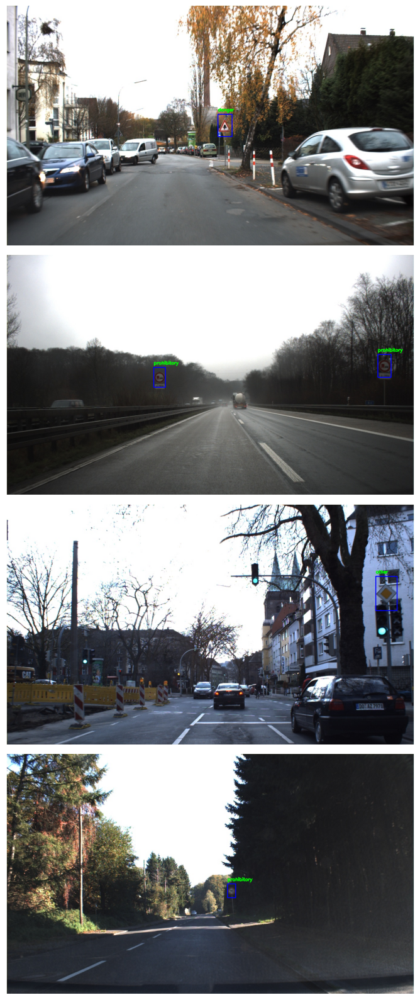

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt  # Import matplotlib for plotting
def plot_images_with_bboxes(samples, images_dir, labels_dir, class_names):
    fig, axes = plt.subplots(nrows=len(samples), ncols=1, figsize=(8, 16))
    axes = axes.flatten()

    for idx, sample in enumerate(samples):
        img_path = os.path.join(images_dir, sample)
        label_path = os.path.join(labels_dir, sample.replace('.jpg', '.txt'))  # Assuming label files are .txt

        # Check if the image exists before proceeding
        if not os.path.exists(img_path):
            print(f"Warning: Image not found at {img_path}")
            continue  # Skip if image is not found

        # Read and convert the image to RGB format for displaying
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        # Check if label file exists and draw bounding boxes
        if os.path.exists(label_path):
            with open(label_path, 'r') as file:
                for line in file:
                    class_id, x, y, w, h = map(float, line.split())
                    h_img, w_img, _ = image.shape
                    x, y, w, h = x * w_img, y * h_img, w * w_img, h * w_img

                    # Calculate the bounding box coordinates
                    x_min, y_min = int(x - w / 2), int(y - h / 2)
                    x_max, y_max = int(x + w / 2), int(y + h / 2)

                    # Draw bounding box and label
                    cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)
                    cv2.putText(image, class_names[int(class_id)], (x_min, max(y_min - 10, 10)),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Display the image with bounding boxes
        axes[idx].imshow(image)
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

samples = random.sample(os.listdir(train_images_dir), 4)  # Randomly sample image files

# Define the class names as in the dataset
class_names = ["prohibitory", "danger", "mandatory", "other"]

# Call the function to plot images with bounding boxes
plot_images_with_bboxes(samples, train_images_dir, train_labels_dir, class_names)


In [ ]:
import os
import cv2
import shutil
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Define the path to save the pre-trained YOLOv8 weights in Google Drive
model_weights_path = '/content/drive/MyDrive/German/yolov8x.pt'

# Download YOLOv8 pre-trained weights from Ultralytics
model = YOLO('yolov8x.pt')  # Loads the pre-trained weights automatically

# Save the downloaded weights to Google Drive
model.save(model_weights_path)


100%|██████████| 131M/131M [00:00<00:00, 281MB/s]


In [ ]:
# Set the directory where you want to save the training results and weights
output_dir = '/content/drive/MyDrive/German/yolo_data/yolo-training-results'

# Define the path to your dataset's configuration file
data_yaml = '/content/drive/MyDrive/YoloOutputs/yolo-data/data.yaml'  # Path to your custom dataset's YAML file

# Initialize the YOLOv8 model
model = YOLO(model_weights_path)  # Load from Google Drive

# Train the model
results = model.train(
    data=data_yaml,
    epochs=50,  # Set the number of epochs
    seed=42,    # For reproducibility
    batch=16,   # Batch size
    imgsz=640   # Image size for training
)

# Save the trained model weights to Google Drive
trained_model_weights_path = '/content/drive/MyDrive/German/yolov8_trained_model.pt'
model.save(trained_model_weights_path)  # Save to Google Drive

# Now the model is saved in Google Drive and can be used later


Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/German/yolov8x.pt, data=/content/drive/MyDrive/YoloOutputs/yolo-data/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, sa

100%|██████████| 755k/755k [00:00<00:00, 24.5MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 103MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/.shortcut-targets-by-id/1-r4BKNGaZKtXxhwrBkpEFRiCYVkqy2fC/yyoloOutputs/yolo-data/train/labels... 592 images, 0 backgrounds, 0 corrupt: 100%|██████████| 592/592 [03:54<00:00,  2.52it/s]

train: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1-r4BKNGaZKtXxhwrBkpEFRiCYVkqy2fC/yyoloOutputs/yolo-data/train/images/00340.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/.shortcut-targets-by-id/1-r4BKNGaZKtXxhwrBkpEFRiCYVkqy2fC/yyoloOutputs/yolo-data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/.shortcut-targets-by-id/1-r4BKNGaZKtXxhwrBkpEFRiCYVkqy2fC/yyoloOutputs/yolo-data/val/labels... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:57<00:00,  2.57it/s]


val: New cache created: /content/drive/.shortcut-targets-by-id/1-r4BKNGaZKtXxhwrBkpEFRiCYVkqy2fC/yyoloOutputs/yolo-data/val/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      12.3G     0.9656      2.491     0.8655         22        640: 100%|██████████| 37/37 [00:48<00:00,  1.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.12s/it]

                   all        149        249      0.291      0.697      0.267      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      12.8G     0.9345      1.059     0.8486         57        640: 100%|██████████| 37/37 [00:48<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        149        249      0.397      0.147      0.244       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      12.8G      1.032     0.9727     0.8676         59        640: 100%|██████████| 37/37 [00:47<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        149        249     0.0116      0.014    0.00667    0.00466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      12.9G      1.015     0.9479     0.8725         40        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        149        249          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      12.9G       1.03     0.8879     0.8808         45        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.60it/s]

                   all        149        249      0.721     0.0259      0.027     0.0201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      12.9G     0.9692      0.706     0.8555         46        640: 100%|██████████| 37/37 [00:46<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        149        249      0.954      0.817      0.892      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      12.9G     0.8675     0.6306     0.8377         50        640: 100%|██████████| 37/37 [00:46<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        149        249      0.955      0.846      0.929      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      12.9G     0.8628     0.6105     0.8312         62        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]

                   all        149        249      0.926      0.902      0.945      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      12.6G     0.8515     0.5841     0.8373         35        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]

                   all        149        249      0.917      0.893      0.947      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      12.6G     0.8154     0.5625      0.825         40        640: 100%|██████████| 37/37 [00:46<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.37it/s]

                   all        149        249      0.954      0.894      0.948      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      12.6G      0.815     0.5432       0.84         52        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        149        249       0.97      0.831      0.934      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      12.7G      0.788     0.5173     0.8281         44        640: 100%|██████████| 37/37 [00:46<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]

                   all        149        249      0.957      0.927      0.973      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      12.7G     0.7667     0.5108     0.8204         34        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        149        249      0.984      0.907      0.968      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      12.9G     0.7434     0.4898     0.8278         47        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]

                   all        149        249      0.957      0.923      0.969      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      12.9G     0.7603     0.5252     0.8241         60        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        149        249      0.954      0.913      0.951      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      12.9G     0.7245     0.4449     0.8066         40        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        149        249       0.97      0.925      0.977      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      12.2G      0.744     0.4552     0.8214         43        640: 100%|██████████| 37/37 [00:46<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        149        249      0.952      0.905      0.972       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      12.2G     0.7237     0.4437      0.819         31        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]

                   all        149        249      0.963      0.954      0.977      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      12.2G      0.695     0.4365     0.8094         47        640: 100%|██████████| 37/37 [00:46<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        149        249      0.945      0.911       0.97      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      12.6G     0.6877     0.4178     0.8146         59        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        149        249      0.962      0.942       0.98      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      12.6G     0.6568     0.4096     0.8005         42        640: 100%|██████████| 37/37 [00:46<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        149        249       0.97      0.945      0.985      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      12.9G     0.6521     0.3886     0.8084         44        640: 100%|██████████| 37/37 [00:45<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.31it/s]

                   all        149        249      0.957      0.964      0.984      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      13.3G      0.652     0.3947      0.806         52        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]

                   all        149        249      0.963      0.942      0.975      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      12.4G     0.6613     0.3896     0.8018         51        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.53it/s]

                   all        149        249      0.947      0.952      0.974      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      12.9G     0.6368     0.3793     0.8081         44        640: 100%|██████████| 37/37 [00:45<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        149        249      0.964      0.959      0.977       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      12.9G     0.6504     0.3745     0.8067         48        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.23it/s]

                   all        149        249       0.96      0.937       0.98      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      12.9G      0.649     0.3773     0.8086         30        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.54it/s]

                   all        149        249      0.979      0.934      0.982      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      12.9G     0.6278      0.368     0.7985         41        640: 100%|██████████| 37/37 [00:45<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.27it/s]

                   all        149        249      0.964      0.956       0.98      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50        13G     0.6162     0.3488     0.7914         36        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.23it/s]

                   all        149        249      0.962      0.966      0.986      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      12.6G     0.5936     0.3436      0.799         47        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.54it/s]

                   all        149        249      0.978      0.931      0.975      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      13.1G     0.5922     0.3466     0.7976         34        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        149        249      0.967      0.965      0.978      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      13.1G     0.5973     0.3483     0.7955         51        640: 100%|██████████| 37/37 [00:44<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all        149        249      0.929      0.957      0.974      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      13.1G     0.5967     0.3294     0.7919         58        640: 100%|██████████| 37/37 [00:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.36it/s]

                   all        149        249       0.94      0.954      0.983      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      13.1G     0.5773     0.3207     0.8048         66        640: 100%|██████████| 37/37 [00:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        149        249      0.955      0.968       0.98      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      13.2G     0.5553     0.3143     0.7921         41        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.38it/s]

                   all        149        249      0.956      0.961      0.977      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      13.2G     0.5618     0.3255     0.7872         48        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.54it/s]

                   all        149        249      0.974      0.945       0.98      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      13.2G     0.5552     0.3118     0.7852         43        640: 100%|██████████| 37/37 [00:45<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]

                   all        149        249      0.943      0.984      0.984      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      13.2G     0.5371     0.3031     0.7982         51        640: 100%|██████████| 37/37 [00:47<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        149        249      0.951      0.953      0.978      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      13.2G     0.5148     0.2967     0.7912         39        640: 100%|██████████| 37/37 [00:47<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        149        249      0.967      0.961      0.982      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      13.2G     0.5455     0.3011     0.7892         55        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        149        249      0.949       0.98      0.983      0.834


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      12.7G     0.4975     0.2958     0.7856         21        640: 100%|██████████| 37/37 [00:47<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        149        249      0.974      0.937       0.98       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      12.7G     0.5116     0.2877     0.7769         29        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        149        249      0.958      0.977      0.984      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      12.7G      0.496     0.2804     0.7901         25        640: 100%|██████████| 37/37 [00:45<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        149        249      0.976      0.943      0.983      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      12.7G     0.4824       0.27     0.7758         27        640: 100%|██████████| 37/37 [00:45<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.54it/s]

                   all        149        249      0.965      0.961      0.978      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      12.7G     0.4729     0.2661     0.7801         25        640: 100%|██████████| 37/37 [00:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.53it/s]

                   all        149        249      0.966      0.948      0.977       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      12.8G     0.4587     0.2586     0.7946         26        640: 100%|██████████| 37/37 [00:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.53it/s]

                   all        149        249      0.968      0.943      0.975      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.8G      0.461     0.2635      0.775         22        640: 100%|██████████| 37/37 [00:44<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        149        249      0.965      0.961      0.977      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      13.2G     0.4584     0.2514     0.7762         22        640: 100%|██████████| 37/37 [00:44<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]

                   all        149        249      0.957      0.966      0.978      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      12.6G     0.4628     0.2536     0.7836         28        640: 100%|██████████| 37/37 [00:44<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.24it/s]

                   all        149        249      0.962      0.966      0.981      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.6G     0.4569     0.2618     0.7783         25        640: 100%|██████████| 37/37 [00:46<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.08s/it]

                   all        149        249      0.963      0.969       0.98      0.841



50 epochs completed in 0.962 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 68,127,420 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


                   all        149        249      0.963      0.969       0.98      0.842
           prohibitory         68        109       0.98      0.991      0.995      0.875
                danger         54         69      0.998          1      0.995      0.872
             mandatory         24         31      0.926      0.935       0.96      0.804
                 other         32         40      0.948       0.95       0.97      0.815
Speed: 0.3ms preprocess, 16.7ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/train


In [ ]:
# After training
trained_model_weights_path = '/content/drive/MyDrive/yolov8_trained_model.pt'
model.save(trained_model_weights_path)  # Save the model weights to the specified path


In [ ]:
# Fix the locale issue
import locale
locale.getpreferredencoding = lambda: 'UTF-8'

!cp -r runs /content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results

train1  /content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1

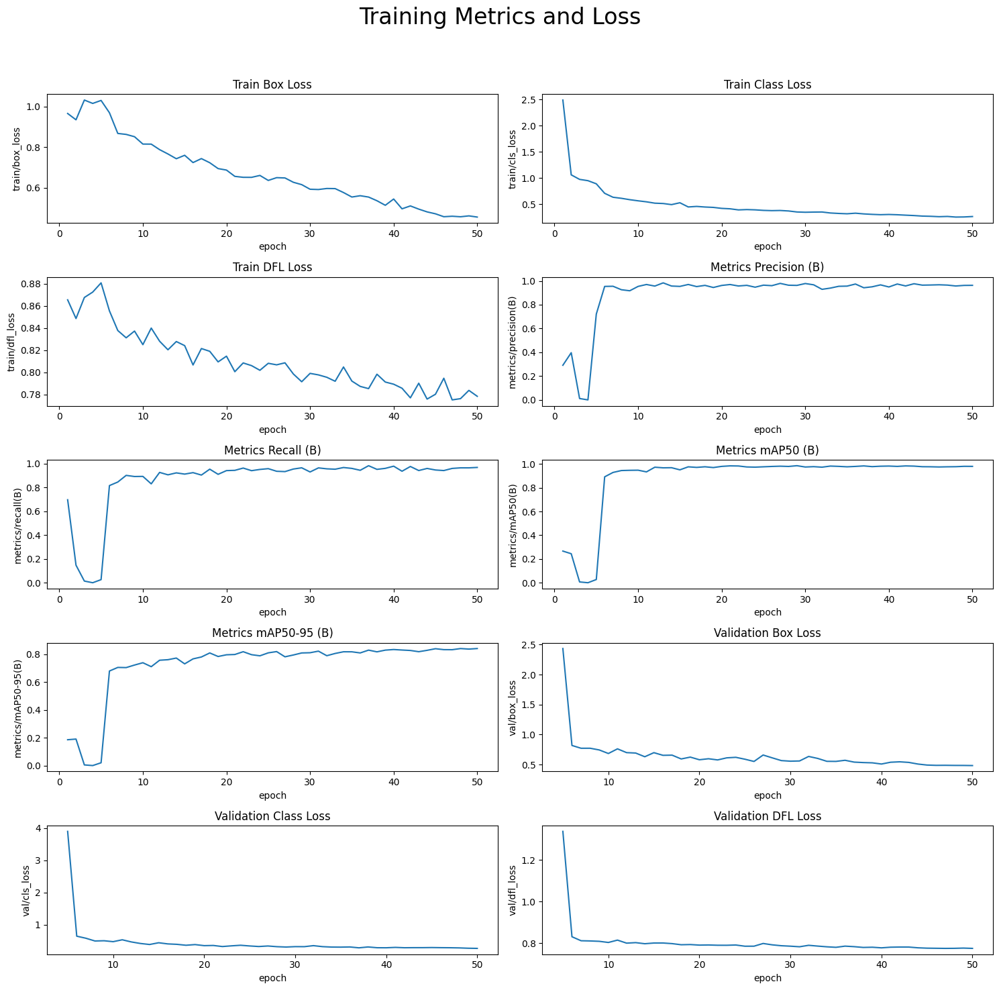

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


results_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/results.csv'

# Load the results
df = pd.read_csv(results_path)
df.columns = df.columns.str.strip()

# List of metrics
metrics_list = [
    ('train/box_loss', 'Train Box Loss'),
    ('train/cls_loss', 'Train Class Loss'),
    ('train/dfl_loss', 'Train DFL Loss'),
    ('metrics/precision(B)', 'Metrics Precision (B)'),
    ('metrics/recall(B)', 'Metrics Recall (B)'),
    ('metrics/mAP50(B)', 'Metrics mAP50 (B)'),
    ('metrics/mAP50-95(B)', 'Metrics mAP50-95 (B)'),
    ('val/box_loss', 'Validation Box Loss'),
    ('val/cls_loss', 'Validation Class Loss'),
    ('val/dfl_loss', 'Validation DFL Loss'),
]


fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))
for ax, (col, title) in zip(axs.flatten(), metrics_list):
    sns.lineplot(x='epoch', y=col, data=df, ax=ax).set(title=title)


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


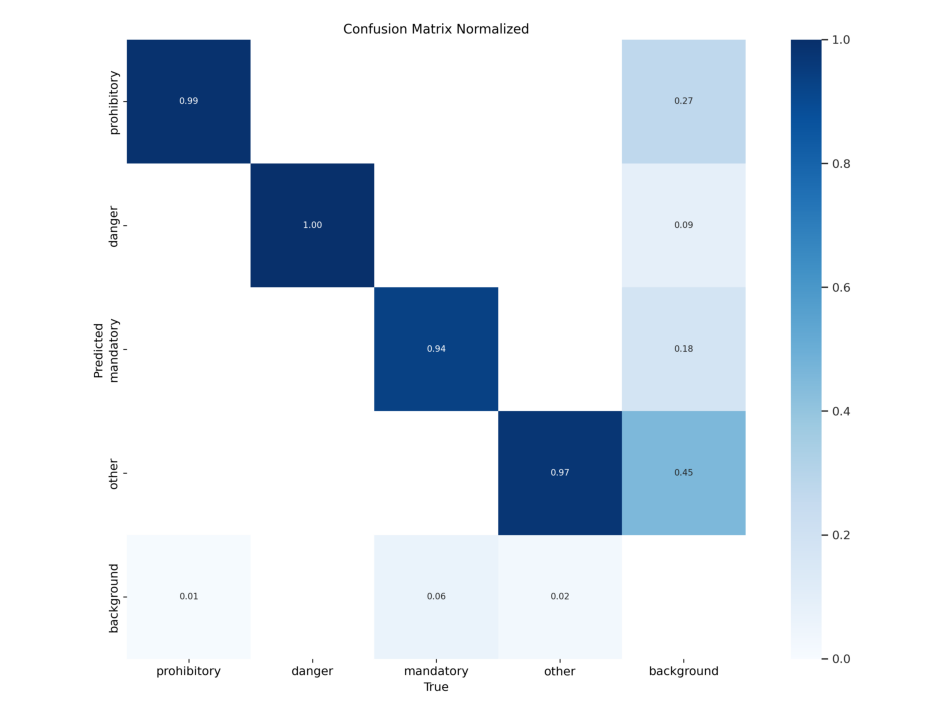

In [ ]:
# Path to confusion matrix image
conf_matrix_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/confusion_matrix_normalized.png'

# Read and display the confusion matrix
conf_matrix = plt.imread(conf_matrix_path)

plt.figure(figsize=(12, 12))
plt.imshow(conf_matrix)
plt.axis('off')  # Hide axes
plt.show()


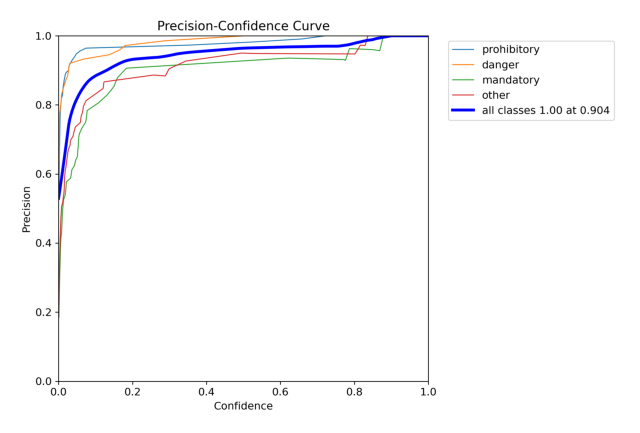

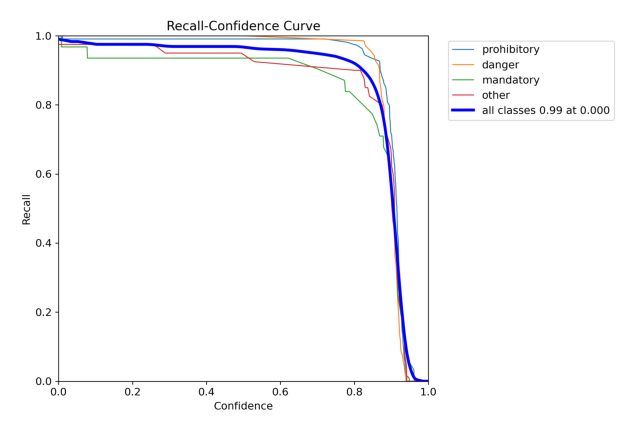

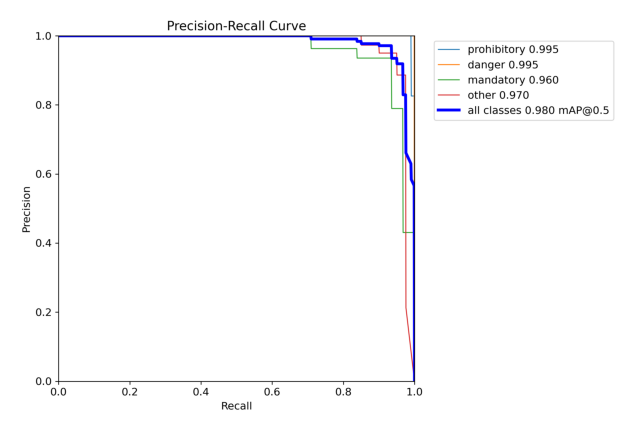

In [ ]:
# Path to precision, recall, and PR curve images
p_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/P_curve.png'
r_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/R_curve.png'
pr_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/PR_curve.png'

# Display precision curve
p_curve = plt.imread(p_curve_path)
plt.figure(figsize=(8, 8))
plt.imshow(p_curve)
plt.axis('off')
plt.show()

# Display recall curve
r_curve = plt.imread(r_curve_path)
plt.figure(figsize=(8, 8))
plt.imshow(r_curve)
plt.axis('off')
plt.show()

# Display precision-recall curve
pr_curve = plt.imread(pr_curve_path)
plt.figure(figsize=(8, 8))
plt.imshow(pr_curve)
plt.axis('off')
plt.show()


In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

# Load the saved model weights
saved_model_path = '/content/drive/MyDrive/German/yolov8_trained_model.pt'
model = YOLO(saved_model_path)

# Define the path to your test image
test_image_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/val/images/00000.jpg'

# Perform prediction
results = model.predict(test_image_path)

# Display the predicted image with bounding boxes
predicted_image = results[0].plot()  # Get the plot with bounding boxes

plt.figure(figsize=(8, 8))
plt.imshow(predicted_image)
plt.axis('off')
plt.show()


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/German/yolov8_trained_model.pt'

In [ ]:
import cv2
import os

# Path to the input video file
video_path = "/content/drive/MyDrive/German/traffic_signs_dataset/traffic-sign-to-test.mp4"
output_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data/frames/"

# Create directory for frames if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Open the video file
cap = cv2.VideoCapture(video_path)

# Frame counter
frame_count = 0

# Loop to extract frames
while True:
    ret, frame = cap.read()
    if not ret:
        break  # If the video is over, exit the loop

    # Save the frame as an image
    frame_filename = os.path.join(output_dir, f"frame_{frame_count}.jpg")
    cv2.imwrite(frame_filename, frame)

    frame_count += 1

# Release the video capture object
cap.release()

print(f"Extracted {frame_count} frames from the video.")


Extracted 56 frames from the video.



0: 384x640 (no detections), 63.5ms
Speed: 3.7ms preprocess, 63.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


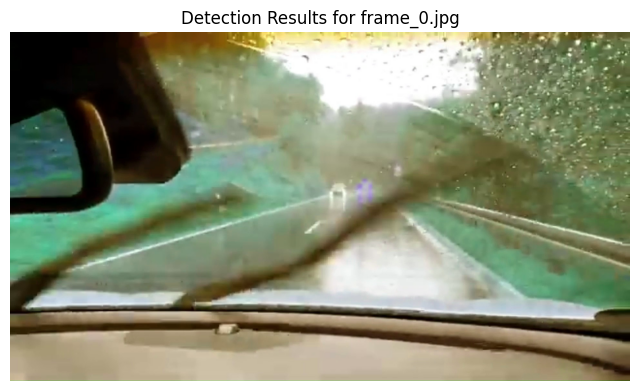


0: 384x640 (no detections), 47.8ms
Speed: 5.6ms preprocess, 47.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


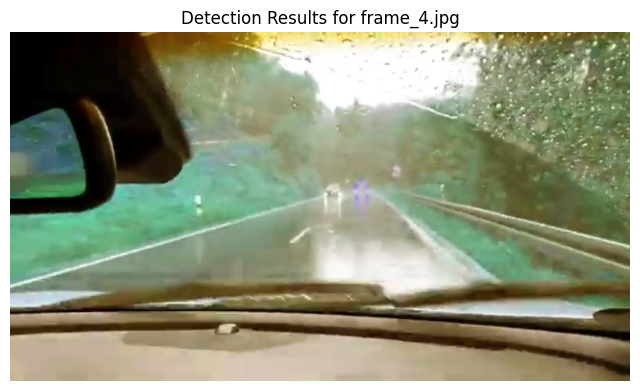


0: 384x640 (no detections), 62.9ms
Speed: 3.4ms preprocess, 62.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


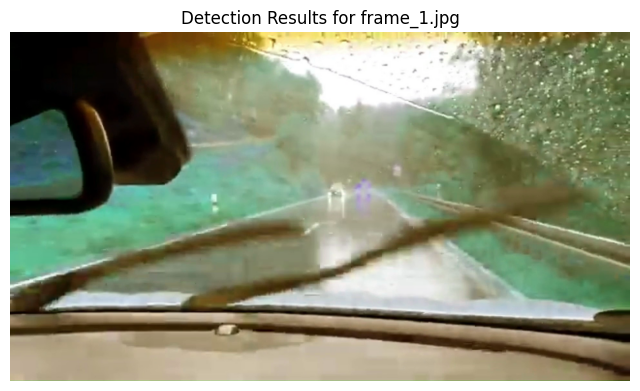


0: 384x640 (no detections), 62.9ms
Speed: 3.6ms preprocess, 62.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


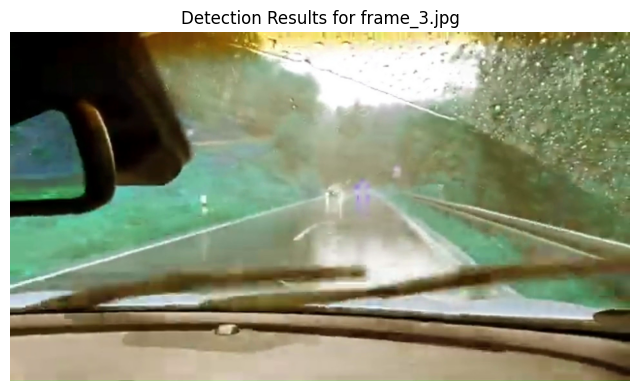


0: 384x640 (no detections), 62.9ms
Speed: 4.0ms preprocess, 62.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


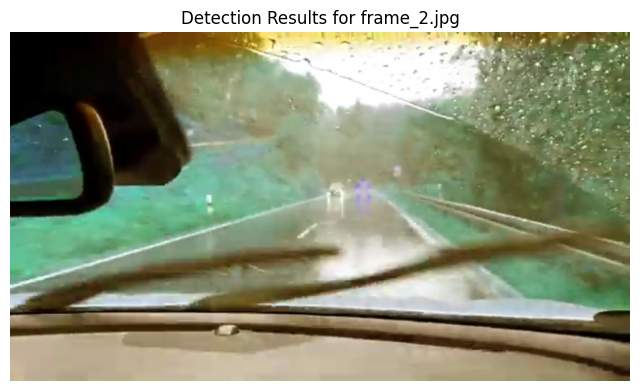

KeyboardInterrupt: 

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import os

# Load your trained YOLOv8 model
model = YOLO('/content/drive/MyDrive/German/yolov8_trained_model.pt')

# Directory where the frames were saved
frames_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data/frames/"

# Get all the frames
frames = [f for f in os.listdir(frames_dir) if f.endswith('.jpg')]

# Iterate over frames and run detection
for frame_name in frames:
    frame_path = os.path.join(frames_dir, frame_name)

    # Read the image
    frame = cv2.imread(frame_path)

    # Run YOLO model prediction on the frame
    results = model.predict(frame)

    # Visualize the predictions
    result_img = results[0].plot()  # This gives us the image with predictions drawn

    # Display the result
    plt.figure(figsize=(8, 8))
    plt.imshow(result_img)
    plt.axis('off')
    plt.title(f"Detection Results for {frame_name}")
    plt.show()


In [ ]:
# Save the result images with bounding boxes
output_with_boxes_dir = "/content/drive/MyDrive/German/yolo-data/frames_with_boxes/"
os.makedirs(output_with_boxes_dir, exist_ok=True)

for frame_name in frames:
    frame_path = os.path.join(frames_dir, frame_name)

    # Read the image
    frame = cv2.imread(frame_path)

    # Run YOLO model prediction on the frame
    results = model.predict(frame)

    # Save the frame with predictions
    result_img = results[0].plot()  # This gives us the image with predictions drawn
    result_img_path = os.path.join(output_with_boxes_dir, frame_name)
    cv2.imwrite(result_img_path, result_img)

    print(f"Saved detected frame with boxes: {frame_name}")


NameError: name 'os' is not defined

In [ ]:
# Run test evaluation
test_metrics = model.val(
    data="/content/drive/MyDrive/German/YoloOutputs/yolo-data/data.yaml",
    split='test'
)

# Print results
test_results = test_metrics.results_dict
print("\n Test Set Performance:")
print(f"  - Precision:      {test_results['metrics/precision(B)']:.3f}")
print(f"  - Recall:         {test_results['metrics/recall(B)']:.3f}")
print(f"  - mAP@50:         {test_results['metrics/mAP50(B)']:.3f}")
print(f"  - mAP@50-95:      {test_results['metrics/mAP50-95(B)']:.3f}")


Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 68,127,420 parameters, 0 gradients, 257.4 GFLOPs


val: Scanning /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data/test/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [01:27<00:00,  1.16s/it]

val: New cache created: /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:15<00:00,  3.18s/it]


                   all         75        125      0.995      0.995      0.994      0.894
           prohibitory         35         53          1       0.98      0.993      0.861
                danger         15         18      0.992          1      0.995      0.921
             mandatory         17         20      0.996          1      0.995      0.891
                 other         24         34      0.994          1      0.995      0.901
Speed: 0.9ms preprocess, 39.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train2

🧪 Test Set Performance:
  - Precision:      0.995
  - Recall:         0.995
  - mAP@50:         0.994
  - mAP@50-95:      0.894


try agian to get the runs folder

In [ ]:
# Fix locale issues in Google Colab
!apt-get update && apt-get install -y locales
!locale-gen en_US.UTF-8
!update-locale LANG=en_US.UTF-8 LC_ALL=en_US.UTF-8


Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,681 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,770 kB]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,237 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-backports InRelease 

In [ ]:
!locale


LANG=en_US.UTF-8
LANGUAGE=en_US
LC_CTYPE="en_US.UTF-8"
LC_NUMERIC="en_US.UTF-8"
LC_TIME="en_US.UTF-8"
LC_COLLATE="en_US.UTF-8"
LC_MONETARY="en_US.UTF-8"
LC_MESSAGES="en_US.UTF-8"
LC_PAPER="en_US.UTF-8"
LC_NAME="en_US.UTF-8"
LC_ADDRESS="en_US.UTF-8"
LC_TELEPHONE="en_US.UTF-8"
LC_MEASUREMENT="en_US.UTF-8"
LC_IDENTIFICATION="en_US.UTF-8"
LC_ALL=en_US.UTF-8


In [ ]:
!pip install numpy==1.26.4
!pip install scipy scikit-image
!pip install albumentations==1.3.1
!pip install imgaug==0.4.0


In [ ]:
!pip uninstall -y numpy albumentations imgaug scipy scikit-image


Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: albumentations 1.3.1
Uninstalling albumentations-1.3.1:
  Successfully uninstalled albumentations-1.3.1
Found existing installation: imgaug 0.4.0
Uninstalling imgaug-0.4.0:
  Successfully uninstalled imgaug-0.4.0
Found existing installation: scipy 1.14.1
Uninstalling scipy-1.14.1:
  Successfully uninstalled scipy-1.14.1
Found existing installation: scikit-image 0.25.2
Uninstalling scikit-image-0.25.2:
  Successfully uninstalled scikit-image-0.25.2


In [ ]:
!pip install numpy==1.26.4  # Compatible with Python 3.11+
!pip install scipy scikit-image  # Must be installed after numpy
!pip install albumentations==1.3.1
!pip install imgaug==0.4.0


  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cuml-cu12 25.2.1 requires scipy>=1.8.0, which is not installed.
hyperopt 0.2.7 requires scipy, which is not installed.
missingno 0.5.2 requires scipy, which is not installed.
pytensor 2.28.3 requires scipy<2,>=1, which is not installed.
pymc 5.21.1 requires scipy>=1.4.1, which is not installed.
umap-learn 0.5.7 requires scipy>=1.3.1, which is not installed.
clarabel 0.10.0 requires scipy, which is not installed.
xarray-einstats 0.8.0 requires scipy>=1.9, which is not installed.
imbalanced-learn 0.13.0 requires scipy<2,>=1.10.1, which is not installed.
mizani 0.13.1 requires scipy>=1.8.0, which is not installed.
datasci

In [ ]:
!pip install --upgrade scipy scikit-learn pandas matplotlib seaborn ultralytics
!pip install albumentations==1.3.1 imgaug==0.4.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 49.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 42.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

In [ ]:
import numpy
import albumentations
import imgaug
import scipy

print("✅ NumPy version:", numpy.__version__)
print("✅ Albumentations version:", albumentations.__version__)
print("✅ Imgaug version:", imgaug.__version__)
print("✅ SciPy version:", scipy.__version__)


✅ NumPy version: 1.26.4
✅ Albumentations version: 1.3.1
✅ Imgaug version: 0.4.0
✅ SciPy version: 1.15.2


In [ ]:
import albumentations as A

fog_transform = A.RandomFog(p=1)  # No invalid parameters
print(fog_transform)  # This will show the actual applied settings


RandomFog(p=1.0, fog_coef_range=(0.3, 1.0), alpha_coef=0.08)


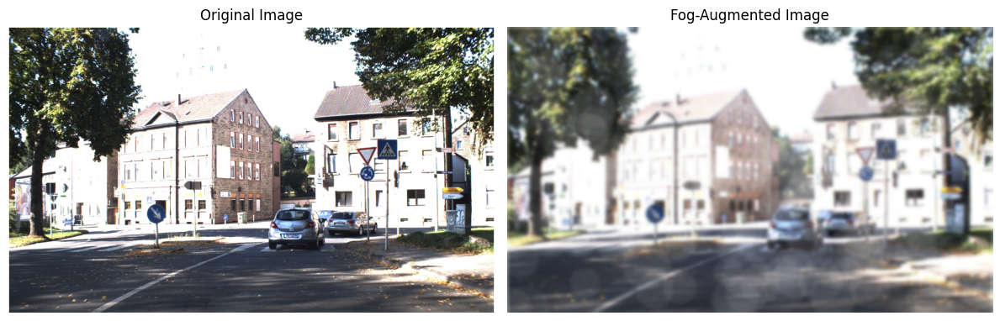

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A

# Path to your example image
image_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/train/images/00001.jpg'

# Load the image
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Could not load image from {image_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Use Albumentations for fog effect
fog_transform = A.Compose([
    A.RandomFog(fog_coef_range=(0.3, 1.0), alpha_coef=0.08, p=1)
])

# Apply fog augmentation
fog_augmented = fog_transform(image=image)['image']

# Display the original and fog-augmented images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Original Image
axs[0].imshow(image)
axs[0].set_title("Original Image")
axs[0].axis('off')

# Fog-Augmented Image
axs[1].imshow(fog_augmented)
axs[1].set_title("Fog-Augmented Image")
axs[1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from imgaug import BoundingBoxesOnImage, BoundingBox

# Path to your example image
image_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/train/images/00001.jpg'

# Load the image
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Could not load image from {image_path}")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Path to the corresponding label file
label_path = image_path.replace('images', 'labels').replace('.jpg', '.txt')

# Load bounding boxes from the YOLO format label file
bboxes = []
try:
    with open(label_path, 'r') as f:
        for line in f:
            values = line.strip().split()
            if len(values) == 5:  # class_id, x_center, y_center, width, height
                bboxes.append([float(v) for v in values])
except FileNotFoundError:
    print(f"Label file not found at {label_path}. Using empty bounding boxes.")

# Convert YOLO format to imgaug BoundingBox
def convert_yolo_to_bbox(yolo_box, img_shape):
    """Convert YOLO format (class_id, x_center, y_center, width, height) to imgaug BoundingBox"""
    class_id, x_center, y_center, width, height = yolo_box

    # Convert normalized coordinates to absolute
    img_height, img_width = img_shape[:2]
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height

    # Convert to (x1, y1, x2, y2) format
    x1 = x_center - width/2
    y1 = y_center - height/2
    x2 = x_center + width/2
    y2 = y_center + height/2

    return BoundingBox(x1=x1, y1=y1, x2=x2, y2=y2, label=int(class_id))

# Convert bounding boxes to imgaug format
bboxes_imgaug = [convert_yolo_to_bbox(bbox, image.shape) for bbox in bboxes]
bboxes_on_image = BoundingBoxesOnImage(bboxes_imgaug, shape=image.shape)

# Function to create snow effect
def add_snow(image, snow_density=0.1, blur_strength=3):
    """Simulate realistic snow with dynamic effects."""

    # Create a snowflake mask
    snow_mask = np.random.random(image.shape[:2]) < snow_density
    snow_mask = np.float32(snow_mask)

    # Apply blur to create a soft, natural snow effect
    snow_mask = cv2.GaussianBlur(snow_mask, (blur_strength, blur_strength), 0)

    # Ensure the snow mask has the same number of channels as the image (RGB)
    snow_mask_rgb = np.repeat(snow_mask[:, :, np.newaxis], 3, axis=2)  # Convert to 3 channels

    # Create a snowflake effect with white snowflakes
    snowflakes = np.ones_like(image) * 255  # White snowflakes
    snow_image = cv2.addWeighted(image, 1, snowflakes, 0.3, 0)

    # Combine the original image with snowflakes using the snow mask
    snow_image = cv2.add(snow_image, np.uint8(snow_mask_rgb * 255))

    return snow_image

# Function to create rain effect
def add_rain(image, slant=-1, drop_length=15, drop_width=1, drop_color=(200, 200, 200), rain_drops=0.01):
    """Add rain effect to an image"""
    image_rain = image.copy()

    # Make darker
    image_rain = cv2.addWeighted(image_rain, 0.8, np.zeros_like(image_rain), 0.2, 0)

    imshape = image.shape
    h, w = imshape[:2]

    # Create random positions for rain drops
    drop_count = int(rain_drops * w * h)

    for i in range(drop_count):
        # Generate random position and length
        x = np.random.randint(0, w-1)
        y = np.random.randint(0, h-1)

        # Draw the raindrop line
        cv2.line(image_rain, (x, y), (x + slant, y + drop_length), drop_color, drop_width)

    return image_rain

# Function to create night effect
def add_dim_light(image, brightness=0.4, contrast=1.2, tint=[80, 60, 40]):
    """Simulate a dimly lit scene like early morning or tunnel lighting."""
    dim_image = cv2.convertScaleAbs(image, alpha=brightness, beta=0)
    tint_layer = np.ones_like(dim_image, dtype=np.uint8) * np.array(tint, dtype=np.uint8)
    return cv2.addWeighted(dim_image, 0.85, tint_layer, 0.15, 0)



# Use Albumentations for fog effect
fog_transform = A.Compose([
    A.RandomFog(fog_coef_range=(0.3, 1.0), alpha_coef=0.08, p=1)
])




# Apply fog augmentation
fog_augmented = fog_transform(image=image)['image']

# Create augmented images using our custom functions
augmented_images = {
    'Original': image.copy(),
    'Fog': fog_augmented,  # Using Albumentations for fog
    #'Rain': add_rain(image),
    #'Snow': add_snow(image),
    #'Dim Light': add_dim_light(image),
}

# Create a figure to display all augmented images
fig, axs = plt.subplots(1, 5, figsize=(20, 6))

# Display each augmented image with bounding boxes
for i, (condition, aug_image) in enumerate(augmented_images.items()):
    # Display image
    axs[i].imshow(aug_image)

    # Draw bounding boxes
    for bbox in bboxes_on_image.bounding_boxes:
        rect = plt.Rectangle(
            (bbox.x1, bbox.y1),
            bbox.x2 - bbox.x1,
            bbox.y2 - bbox.y1,
            linewidth=2,
            edgecolor='r',
            facecolor='none'
        )
        axs[i].add_patch(rect)

    axs[i].set_title(condition)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

print("These custom weather effects provide realistic augmentations for training your traffic sign recognition model.")


ModuleNotFoundError: No module named 'imgaug'

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A


In [ ]:
import os
# Define paths
original_dataset_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data"
augmented_dataset_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"


os.makedirs(augmented_dataset_path, exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/train/images", exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/train/labels", exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/val/images", exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/val/labels", exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/test/images", exist_ok=True)
os.makedirs(f"{augmented_dataset_path}/test/labels", exist_ok=True)

In [ ]:
# Function to create snow effect
def add_snow(image, snow_density=0.1, blur_strength=3):
    """Simulate realistic snow with dynamic effects."""

    # Create a snowflake mask
    snow_mask = np.random.random(image.shape[:2]) < snow_density
    snow_mask = np.float32(snow_mask)

    # Apply blur to create a soft, natural snow effect
    snow_mask = cv2.GaussianBlur(snow_mask, (blur_strength, blur_strength), 0)

    # Ensure the snow mask has the same number of channels as the image (RGB)
    snow_mask_rgb = np.repeat(snow_mask[:, :, np.newaxis], 3, axis=2)  # Convert to 3 channels

    # Create a snowflake effect with white snowflakes
    snowflakes = np.ones_like(image) * 255  # White snowflakes
    snow_image = cv2.addWeighted(image, 1, snowflakes, 0.3, 0)

    # Combine the original image with snowflakes using the snow mask
    snow_image = cv2.add(snow_image, np.uint8(snow_mask_rgb * 255))

    return snow_image

# Function to create rain effect
def add_rain(image, slant=-1, drop_length=15, drop_width=1, drop_color=(200, 200, 200), rain_drops=0.01):
    """Add rain effect to an image"""
    image_rain = image.copy()

    # Make darker
    image_rain = cv2.addWeighted(image_rain, 0.8, np.zeros_like(image_rain), 0.2, 0)

    imshape = image.shape
    h, w = imshape[:2]

    # Create random positions for rain drops
    drop_count = int(rain_drops * w * h)

    for i in range(drop_count):
        # Generate random position and length
        x = np.random.randint(0, w-1)
        y = np.random.randint(0, h-1)

        # Draw the raindrop line
        cv2.line(image_rain, (x, y), (x + slant, y + drop_length), drop_color, drop_width)

    return image_rain

# Function to create night effect
def add_dim_light(image, brightness=0.4, contrast=1.2, tint=[80, 60, 40]):
    """Simulate a dimly lit scene like early morning or tunnel lighting."""
    dim_image = cv2.convertScaleAbs(image, alpha=brightness, beta=0)
    tint_layer = np.ones_like(dim_image, dtype=np.uint8) * np.array(tint, dtype=np.uint8)
    return cv2.addWeighted(dim_image, 0.85, tint_layer, 0.15, 0)


In [ ]:
import os
import cv2
import shutil
import time
import numpy as np
import albumentations as A




# Define dataset paths
original_dataset_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data"
augmented_dataset_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"

# Subdirectories
subdirs = ["train", "val", "test"]

# Ensure new dataset directories exist
for subdir in subdirs:
    os.makedirs(f"{augmented_dataset_path}/{subdir}/images", exist_ok=True)
    os.makedirs(f"{augmented_dataset_path}/{subdir}/labels", exist_ok=True)

# Define augmentations
augmentations = {
    "fog": lambda img: A.Compose([
        A.RandomFog(fog_coef_range=(0.3, 1.0), alpha_coef=0.08, p=1)
    ])(image=img)['image'],
    "rain": lambda img: add_rain(img),
    "snow": lambda img: add_snow(img),
    "dim_light": lambda img: add_dim_light(img)
}

# Start overall time tracking
start_time_total = time.time()

# Process each split (train, val, test)
for split in subdirs:
    print(f"🔹 Processing {split} set...")
    start_time_split = time.time()  # Start time for this split

    image_dir = f"{original_dataset_path}/{split}/images"
    label_dir = f"{original_dataset_path}/{split}/labels"
    aug_image_dir = f"{augmented_dataset_path}/{split}/images"
    aug_label_dir = f"{augmented_dataset_path}/{split}/labels"

    # List all images
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]

    for idx, image_file in enumerate(image_files, start=1):
        img_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, image_file.replace(".jpg", ".txt"))

        # Read image
        image = cv2.imread(img_path)
        if image is None:
            print(f"⚠️ Warning: Could not load {img_path}, skipping.")
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Copy the original image and label to the new dataset
        shutil.copy(img_path, os.path.join(aug_image_dir, image_file))
        shutil.copy(label_path, os.path.join(aug_label_dir, image_file.replace(".jpg", ".txt")))

        # Apply each augmentation and save
        for aug_name, aug_func in augmentations.items():
            aug_start_time = time.time()  # Start time for this augmentation

            augmented = aug_func(image)
            aug_filename = f"{image_file.replace('.jpg', f'_{aug_name}.jpg')}"
            aug_img_path = os.path.join(aug_image_dir, aug_filename)
            aug_label_path = os.path.join(aug_label_dir, aug_filename.replace(".jpg", ".txt"))

            # Save augmented image
            cv2.imwrite(aug_img_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

            # Copy the corresponding label file
            if os.path.exists(label_path):
                shutil.copy(label_path, aug_label_path)

            aug_time_taken = time.time() - aug_start_time  # Time taken for augmentation
            print(f"✅ {aug_name} applied to {image_file} ({aug_time_taken:.2f} sec)")

        # Progress update every 100 images
        if idx % 100 == 0:
            print(f"🔄 Processed {idx}/{len(image_files)} images in {split} set...")

    split_time_taken = time.time() - start_time_split  # Time taken for this split
    print(f"⏳ {split} set processed in {split_time_taken:.2f} seconds.")

total_time_taken = time.time() - start_time_total  # Total time taken for all splits
print(f"\n✅ Data augmentation completed! Total time: {total_time_taken:.2f} seconds.")


🔹 Processing train set...
✅ fog applied to 00414.jpg (1.08 sec)
✅ rain applied to 00414.jpg (0.65 sec)
✅ snow applied to 00414.jpg (0.68 sec)
✅ dim_light applied to 00414.jpg (0.46 sec)
✅ fog applied to 00601.jpg (0.97 sec)
✅ rain applied to 00601.jpg (0.66 sec)
✅ snow applied to 00601.jpg (0.68 sec)
✅ dim_light applied to 00601.jpg (0.53 sec)
✅ fog applied to 00622.jpg (1.46 sec)
✅ rain applied to 00622.jpg (0.66 sec)
✅ snow applied to 00622.jpg (0.67 sec)
✅ dim_light applied to 00622.jpg (0.44 sec)
✅ fog applied to 00227.jpg (1.51 sec)
✅ rain applied to 00227.jpg (0.61 sec)
✅ snow applied to 00227.jpg (0.56 sec)
✅ dim_light applied to 00227.jpg (0.48 sec)
✅ fog applied to 00204.jpg (1.12 sec)
✅ rain applied to 00204.jpg (0.89 sec)
✅ snow applied to 00204.jpg (0.58 sec)
✅ dim_light applied to 00204.jpg (0.40 sec)
✅ fog applied to 00150.jpg (1.47 sec)
✅ rain applied to 00150.jpg (0.61 sec)
✅ snow applied to 00150.jpg (0.52 sec)
✅ dim_light applied to 00150.jpg (0.44 sec)
✅ fog applied 

In [ ]:
import os

# Paths to augmented dataset folders
augmented_dataset_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"

# Function to get original image names (excluding augmentations)
def get_original_image_names(image_dir):
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    original_images = set(f.split('_')[0] + ".jpg" for f in image_files)  # Remove augmentation suffixes
    return original_images

# Get original images (without augmentation) from each split
train_images = get_original_image_names(f"{augmented_dataset_path}/train/images")
val_images = get_original_image_names(f"{augmented_dataset_path}/val/images")
test_images = get_original_image_names(f"{augmented_dataset_path}/test/images")

# Check for duplicate test images in train or val
test_in_train = test_images.intersection(train_images)
test_in_val = test_images.intersection(val_images)

# Check if augmented images exist as originals in different splits
train_val_overlap = train_images.intersection(val_images)

# Display results
if test_in_train:
    print(" Test images found in Train:", test_in_train)
else
    print("No test images found in Train.")

if test_in_val:
    print("Test images found in Validation:", test_in_val)
else:
    print("No test images found in Validation.")

if train_val_overlap:
    print("Some Train images are also found in Validation:", train_val_overlap)
else:
    print("No duplicate original images between Train & Validation.")

print(" Check completed!")


✅ No test images found in Train.
✅ No test images found in Validation.
✅ No duplicate original images between Train & Validation.
✅ Check completed!


In [ ]:
!pip install albumentations imgaug opencv-python numpy matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 25.9 MB/s eta 0:00:00


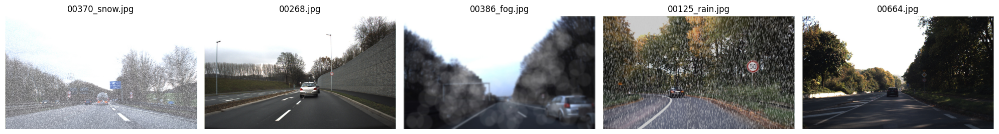

In [ ]:
import matplotlib.pyplot as plt
import random
import os
import cv2

# Define paths for augmented images
augmented_images_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images"

# Get all augmented images
all_augmented_images = sorted(os.listdir(augmented_images_path))

# Select random samples to display
num_samples = 5
sample_images = random.sample(all_augmented_images, min(num_samples, len(all_augmented_images)))

# Display the images
fig, axes = plt.subplots(1, len(sample_images), figsize=(20, 6))

for i, img_name in enumerate(sample_images):
    img_path = os.path.join(augmented_images_path, img_name)
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

    axes[i].imshow(image)
    axes[i].set_title(img_name)
    axes[i].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import os

# Path to your dataset base directory
base_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"

# Subfolders to check
splits = ['train', 'val', 'test']

# Count images in each split
for split in splits:
    img_dir = os.path.join(base_path, split, 'images')
    if os.path.exists(img_dir):
        num_images = len([f for f in os.listdir(img_dir) if f.endswith('.jpg')])
        print(f"{split.upper()}: {num_images} images")
    else:
        print(f"{split.upper()}: Folder does not exist.")


TRAIN: 2590 images
VAL: 740 images
TEST: 375 images


🔍 Image Path: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images/00001_fog.jpg
🔍 Label Path: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/00001_fog.txt
✅ Displaying Image: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images/00001_fog.jpg
🟢 Bounding Box: x_min=983, y_min=387, x_max=1024, y_max=431
🟢 Bounding Box: x_min=386, y_min=494, x_max=441, y_max=552
🟢 Bounding Box: x_min=973, y_min=335, x_max=1031, y_max=390


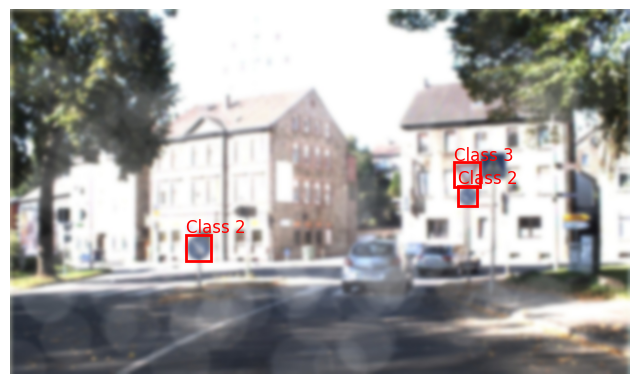

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Define paths to augmented images and labels
augmented_images_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images"
augmented_labels_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels"

# Select an augmented image and corresponding label file
sample_image_name = "00001_fog.jpg"  # Change this to test different images
sample_label_name = "00001_fog.txt"  # Labels do not have "_Fog"

sample_image_path = os.path.join(augmented_images_path, sample_image_name)
sample_label_path = os.path.join(augmented_labels_path, sample_label_name)

# Debugging: Print file paths to check if they exist
print(f"🔍 Image Path: {sample_image_path}")
print(f"🔍 Label Path: {sample_label_path}")

# Check if the image and label file exist
if not os.path.exists(sample_image_path):
    print(f"❌ Error: Image not found at {sample_image_path}")
elif not os.path.exists(sample_label_path):
    print(f"❌ Error: Label file not found at {sample_label_path}")
else:
    print(f"✅ Displaying Image: {sample_image_path}")

    # Load the image
    image = cv2.imread(sample_image_path)
    if image is None:
        print(f"❌ Error: Unable to load image {sample_image_path}.")
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

        # Read bounding box labels
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(image)

        # Check if label file exists before reading
        if os.path.exists(sample_label_path):
            with open(sample_label_path, "r") as f:
                for line in f:
                    values = line.strip().split()
                    if len(values) != 5:
                        print(f"⚠️ Skipping invalid line in label file: {line}")
                        continue  # Skip incorrectly formatted lines

                    class_id, x_center, y_center, width, height = map(float, values)

                    h, w, _ = image.shape  # Image dimensions
                    x_min = int((x_center - width / 2) * w)
                    y_min = int((y_center - height / 2) * h)
                    x_max = int((x_center + width / 2) * w)
                    y_max = int((y_center + height / 2) * h)

                    # Debug: Print bounding box values
                    print(f"🟢 Bounding Box: x_min={x_min}, y_min={y_min}, x_max={x_max}, y_max={y_max}")

                    # Draw bounding box
                    rect = patches.Rectangle(
                        (x_min, y_min),
                        x_max - x_min,
                        y_max - y_min,
                        linewidth=2,
                        edgecolor="red",
                        facecolor="none"
                    )
                    ax.add_patch(rect)
                    ax.text(x_min, y_min - 5, f"Class {int(class_id)}", color="red", fontsize=12)

        ax.axis("off")
        plt.show()


In [ ]:
!pip install ultralytics
from ultralytics import YOLO


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 61.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
import os

# Define dataset paths
train_images_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images"
val_images_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/val/images"
test_images_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images"
output_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"

# Ensure paths exist
os.makedirs(output_dir, exist_ok=True)

# Create YAML configuration with test
data_yaml = f"""names:
  0: prohibitory
  1: danger
  2: mandatory
  3: other
nc: 4
train: {train_images_dir}
val: {val_images_dir}
test: {test_images_dir}
"""

# Save `data.yaml`
yaml_path = os.path.join(output_dir, "data.yaml")
with open(yaml_path, "w") as f:
    f.write(data_yaml)

print(f"✅ Dataset configuration file updated at: {yaml_path}")


✅ Dataset configuration file updated at: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/data.yaml


In [ ]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Number of GPUs:", torch.cuda.device_count())


CUDA Available: True
Number of GPUs: 1


In [ ]:
import tensorboard
import tensorflow as tf
print("TensorBoard version:", tensorboard.__version__)
print("TensorFlow version:", tf.__version__)


TensorBoard version: 2.18.0
TensorFlow version: 2.18.0


In [ ]:
!head -n 5 /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/*.txt


==> /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/00001_dim_light.txt <==
2 0.7378676470588236 0.5125 0.030147058823529412 0.055
2 0.3044117647058823 0.65375 0.041176470588235294 0.0725
3 0.736764705882353 0.453125 0.04264705882352941 0.06875

==> /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/00001_fog.txt <==
2 0.7378676470588236 0.5125 0.030147058823529412 0.055
2 0.3044117647058823 0.65375 0.041176470588235294 0.0725
3 0.736764705882353 0.453125 0.04264705882352941 0.06875

==> /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/00001_rain.txt <==
2 0.7378676470588236 0.5125 0.030147058823529412 0.055
2 0.3044117647058823 0.65375 0.041176470588235294 0.0725
3 0.736764705882353 0.453125 0.04264705882352941 0.06875

==> /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels/00001_snow.txt <==
2 0.7378676470588236 0.5125 0.030147058823529412 0.055
2 0.3044117647058823 0.65375 0.04117647

In [ ]:
!rm /content/drive/MyDrive/YoloOutputs/yolo-data-augmented/train/labels.cache
!rm /content/drive/MyDrive/YoloOutputs/yolo-data-augmented/val/labels.cache


In [ ]:
import os
import shutil

# Set your image and label directories here
train_img_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/images"
train_lbl_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/train/labels"

val_img_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/val/images"
val_lbl_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/val/labels"


In [ ]:
def clear_labels(label_dir):
    for f in os.listdir(label_dir):
        if f.endswith('.txt'):
            os.remove(os.path.join(label_dir, f))

# Clear old labels from both train and val
clear_labels(train_lbl_dir)
clear_labels(val_lbl_dir)


In [ ]:
import shutil
import os
from ultralytics import YOLO

# Load the pre-trained model (original dataset trained)
model = YOLO("/content/drive/MyDrive/German/yolov8_trained_model.pt")

# Define paths for saving checkpoints
runs_dir = "runs/detect/train"  # Default YOLO training output directory
drive_save_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/checkpoints"

# Ensure the Drive save directory exists
os.makedirs(drive_save_path, exist_ok=True)

# Resume training on the augmented dataset
model.train(
    data="/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/data.yaml",
    epochs=30,         # Number of epochs
    batch=4,           # Reduce batch size to prevent RAM issues
    imgsz=640,         # Image size
    seed=42,           # For reproducibility
    optimizer="auto",  # Automatically selects the best optimizer
    pretrained=True,   # Continue training from existing model
    device="cuda",     # Run on GPU
    save=True,
    save_period=5      # Save weights every 5 epochs
)

# Function to save checkpoints to Google Drive after every `save_period`
def save_checkpoints():
    try:
        latest_weights = f"{runs_dir}/weights/"
        shutil.copytree(latest_weights, f"{drive_save_path}/weights", dirs_exist_ok=True)
        print(f"✅ Model checkpoints saved to Google Drive: {drive_save_path}/weights")
    except Exception as e:
        print(f"⚠️ Failed to save checkpoints: {e}")

# Save model checkpoints after every `save_period`
save_checkpoints()

# Save final trained model
final_model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model.save(final_model_path)
print(f"✅ Final trained model saved to: {final_model_path}")


Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/German/yolov8_trained_model.pt, data=/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/data.yaml, epochs=30, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=5, cache=False, device=cuda, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_t

train: Scanning /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/train/labels... 2590 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2590/2590 [29:31<00:00,  1.46it/s]


train: New cache created: /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/labels... 740 images, 0 backgrounds, 0 corrupt: 100%|██████████| 740/740 [08:10<00:00,  1.51it/s]

val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/images/00340.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/images/00340_dim_light.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/images/00340_fog.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/images/00340_rain.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/images/00340_snow.jpg: 1 duplicate labels removed


val: New cache created: /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/val/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.56G     0.7504     0.5547     0.8238          6        640: 100%|██████████| 648/648 [03:48<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:20<00:00,  4.50it/s]

                   all        740       1205      0.938      0.815      0.907      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.69G     0.8173     0.6427     0.8337          4        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.72it/s]


                   all        740       1205      0.938      0.753      0.846      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.81G     0.8241     0.6372     0.8257          3        640: 100%|██████████| 648/648 [03:44<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  5.01it/s]

                   all        740       1205      0.935      0.824       0.89      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       5.3G     0.8143     0.6048     0.8274          8        640: 100%|██████████| 648/648 [03:42<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.85it/s]

                   all        740       1205      0.921      0.697      0.806      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.68G     0.8014     0.5804     0.8217          2        640: 100%|██████████| 648/648 [03:42<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.95it/s]

                   all        740       1205       0.94      0.846      0.913      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       6.1G     0.7825     0.5349      0.819          6        640: 100%|██████████| 648/648 [03:42<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.95it/s]

                   all        740       1205      0.958      0.839      0.918      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       6.1G     0.7425     0.4891     0.8117          4        640: 100%|██████████| 648/648 [03:41<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  5.02it/s]

                   all        740       1205      0.971      0.839      0.922      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       6.1G     0.7319     0.4872     0.8128          3        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.85it/s]

                   all        740       1205      0.957       0.86      0.927      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       6.1G     0.7305     0.4902     0.8099          5        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.80it/s]

                   all        740       1205      0.943      0.872      0.923      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       6.1G     0.7004     0.4574     0.8059          6        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.90it/s]

                   all        740       1205      0.956      0.854      0.931      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       6.1G     0.7011       0.46     0.8088          6        640: 100%|██████████| 648/648 [03:41<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.79it/s]

                   all        740       1205      0.966      0.848      0.934      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       6.1G     0.6793     0.4343     0.8082          2        640: 100%|██████████| 648/648 [03:41<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.73it/s]

                   all        740       1205      0.947      0.856      0.927       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       6.1G     0.6655      0.419     0.8074          5        640: 100%|██████████| 648/648 [03:42<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.72it/s]

                   all        740       1205      0.932       0.87      0.936      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       6.1G     0.6805     0.4198     0.8078          3        640: 100%|██████████| 648/648 [03:41<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.84it/s]

                   all        740       1205       0.97      0.857      0.938      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       6.1G     0.6588     0.4116     0.8024          4        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.93it/s]

                   all        740       1205      0.965      0.889       0.95      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       6.1G     0.6257     0.3837     0.7986         12        640: 100%|██████████| 648/648 [03:44<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.92it/s]

                   all        740       1205      0.973      0.894      0.956      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       6.1G     0.6249      0.382     0.8015          3        640: 100%|██████████| 648/648 [03:44<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.95it/s]

                   all        740       1205      0.948      0.881       0.95      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       6.1G     0.6196     0.3829     0.8062          2        640: 100%|██████████| 648/648 [03:42<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  5.00it/s]

                   all        740       1205      0.977      0.867       0.94      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       6.1G     0.6034     0.3588     0.7942         12        640: 100%|██████████| 648/648 [03:42<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.95it/s]

                   all        740       1205      0.944      0.891      0.941       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       6.1G     0.5916     0.3448     0.7919         11        640: 100%|██████████| 648/648 [03:44<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.71it/s]

                   all        740       1205      0.968      0.866      0.944       0.79


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       6.1G     0.5994     0.3488     0.7964          3        640: 100%|██████████| 648/648 [03:43<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.74it/s]

                   all        740       1205      0.957      0.887      0.945      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       6.1G     0.5878     0.3413     0.7936          2        640: 100%|██████████| 648/648 [03:42<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.71it/s]

                   all        740       1205      0.943      0.902      0.954      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       6.1G      0.567     0.3247     0.7952          3        640: 100%|██████████| 648/648 [03:44<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.70it/s]

                   all        740       1205      0.972      0.879      0.946      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       6.1G     0.5639     0.3246     0.7945          3        640: 100%|██████████| 648/648 [03:44<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:20<00:00,  4.58it/s]

                   all        740       1205      0.954      0.882      0.941      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       6.1G     0.5489     0.3196     0.7895          3        640: 100%|██████████| 648/648 [03:48<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:22<00:00,  4.13it/s]

                   all        740       1205      0.961      0.884      0.953      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30       6.1G     0.5249     0.3023     0.7881          3        640: 100%|██████████| 648/648 [03:50<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.92it/s]

                   all        740       1205      0.968      0.895      0.952      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       6.1G      0.526     0.2878     0.7888          1        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.80it/s]

                   all        740       1205      0.955      0.902      0.956      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30       6.1G     0.4986     0.2731     0.7788          4        640: 100%|██████████| 648/648 [03:42<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:18<00:00,  4.97it/s]

                   all        740       1205       0.97      0.888      0.951      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       6.1G     0.5007     0.2802     0.7856          2        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:20<00:00,  4.63it/s]

                   all        740       1205      0.979      0.888      0.951      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       6.1G     0.4894     0.2644     0.7826          2        640: 100%|██████████| 648/648 [03:43<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.77it/s]

                   all        740       1205      0.976      0.899       0.95       0.81



30 epochs completed in 2.083 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 136.7MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 68,127,420 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 93/93 [00:19<00:00,  4.81it/s]


                   all        740       1205      0.955      0.902      0.957      0.813
           prohibitory        345        520       0.94      0.988      0.993       0.87
                danger        150        190      0.952      0.942      0.966      0.829
             mandatory        165        195      0.981      0.807      0.931      0.775
                 other        245        300      0.946      0.872      0.936      0.776
Speed: 0.2ms preprocess, 17.2ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/train2
✅ Model checkpoints saved to Google Drive: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/checkpoints/weights
✅ Final trained model saved to: /content/drive/MyDrive/German/yolov8_low_visibility_trained.pt


In [ ]:
import time
while True:
    print("Keeping session active...")
    time.sleep(600)  # Prevents timeout every 10 minutes


Keeping session active...


KeyboardInterrupt: 

In [ ]:
# Fix the locale issue
import locale
locale.getpreferredencoding = lambda: 'UTF-8'

!cp -r runs/detect/train2 /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/yolo-training-results

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


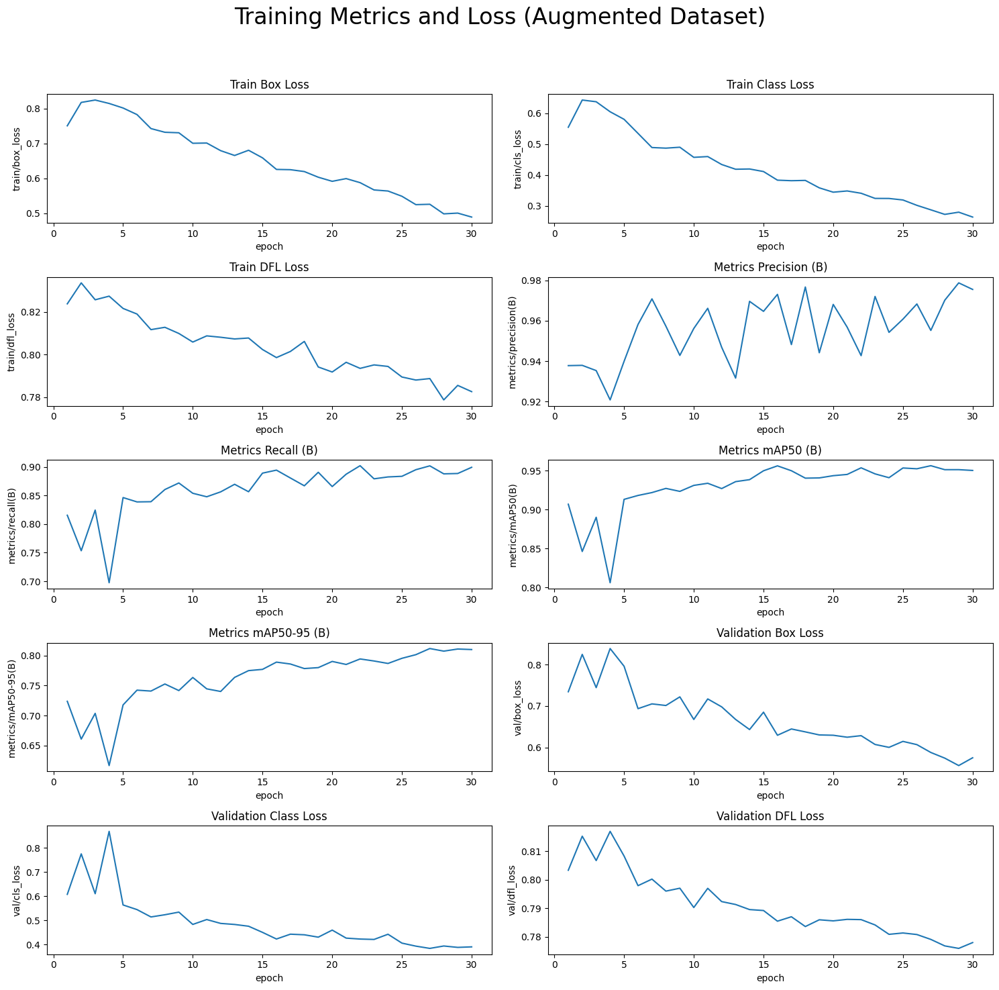

In [ ]:
# ========== 1. Load and Plot Training Metrics ==========
results_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/results.csv'

df = pd.read_csv(results_path)
df.columns = df.columns.str.strip()

metrics_list = [
    ('train/box_loss', 'Train Box Loss'),
    ('train/cls_loss', 'Train Class Loss'),
    ('train/dfl_loss', 'Train DFL Loss'),
    ('metrics/precision(B)', 'Metrics Precision (B)'),
    ('metrics/recall(B)', 'Metrics Recall (B)'),
    ('metrics/mAP50(B)', 'Metrics mAP50 (B)'),
    ('metrics/mAP50-95(B)', 'Metrics mAP50-95 (B)'),
    ('val/box_loss', 'Validation Box Loss'),
    ('val/cls_loss', 'Validation Class Loss'),
    ('val/dfl_loss', 'Validation DFL Loss'),
]

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))
for ax, (col, title) in zip(axs.flatten(), metrics_list):
    sns.lineplot(x='epoch', y=col, data=df, ax=ax).set(title=title)

plt.suptitle('Training Metrics and Loss (Augmented Dataset)', fontsize=24)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

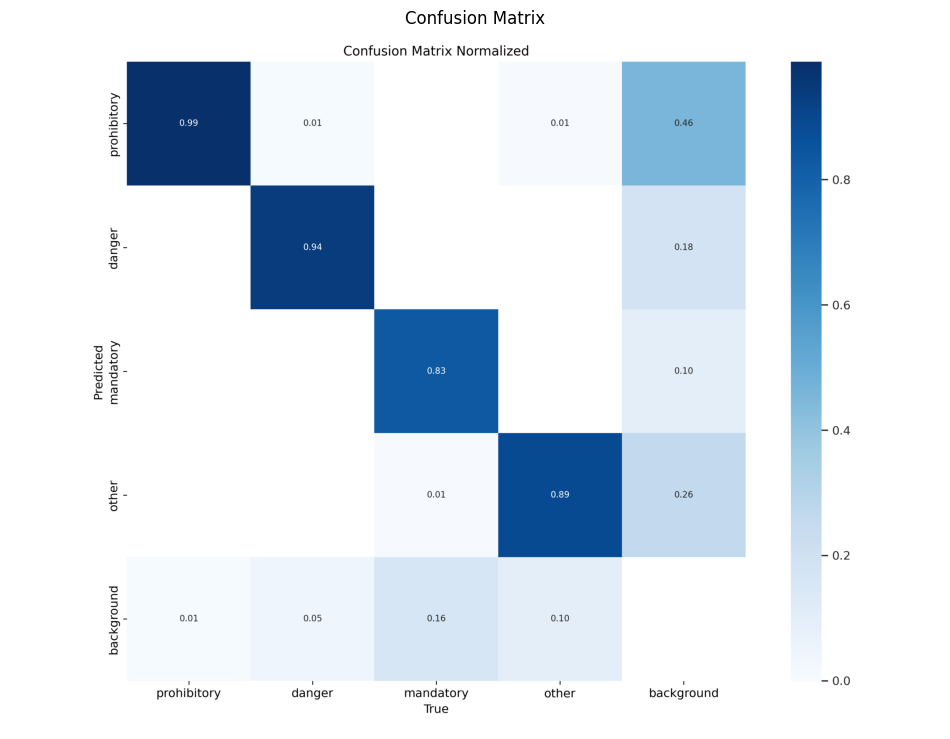

In [ ]:
# ========== 2. Confusion Matrix ==========
conf_matrix_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/confusion_matrix_normalized.png'
conf_matrix = plt.imread(conf_matrix_path)

plt.figure(figsize=(12, 12))
plt.imshow(conf_matrix)
plt.axis('off')
plt.title('Confusion Matrix')
plt.show()


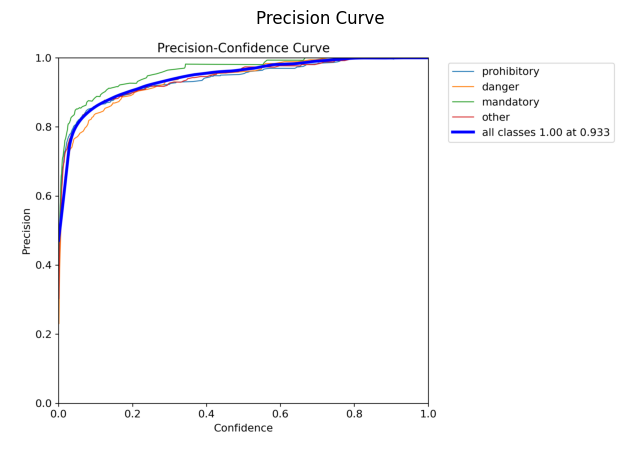

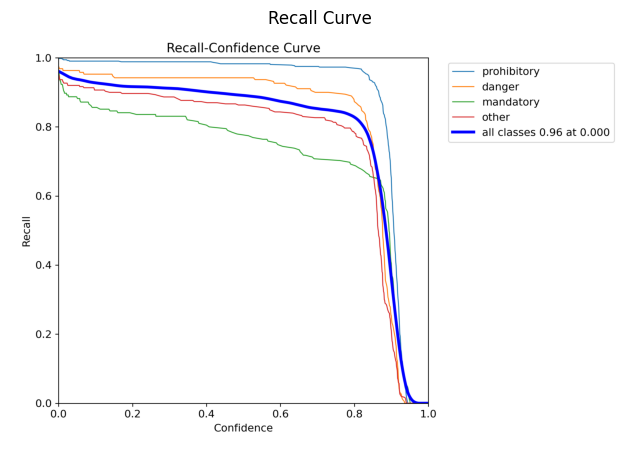

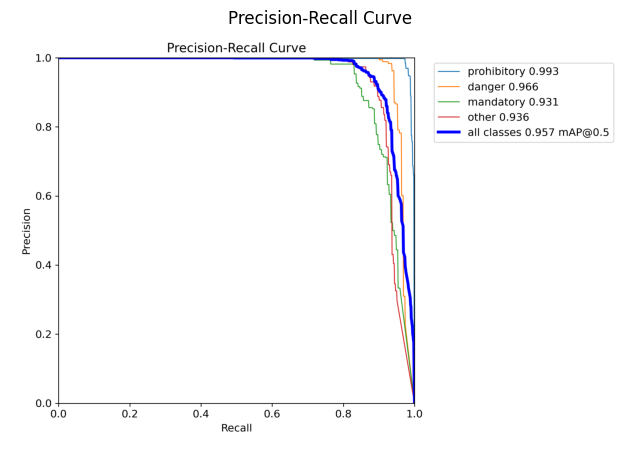

In [ ]:
# ========== 3. Precision, Recall, PR Curves ==========
p_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/P_curve.png'
r_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/R_curve.png'
pr_curve_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/PR_curve.png'

for path, title in zip([p_curve_path, r_curve_path, pr_curve_path],
                       ['Precision Curve', 'Recall Curve', 'Precision-Recall Curve']):
    img = plt.imread(path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()


Original columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2', 'Model']
Augmented columns: ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2', 'Model']


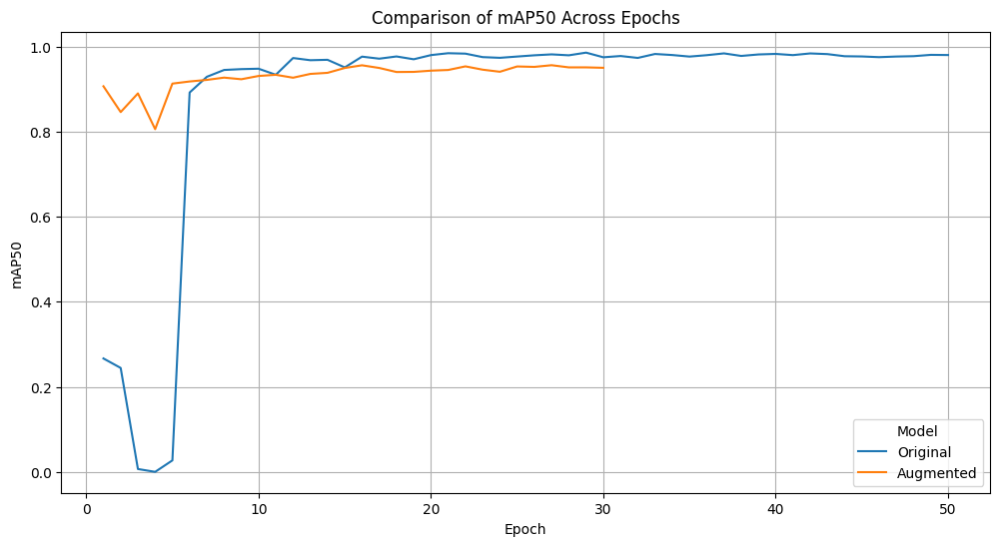

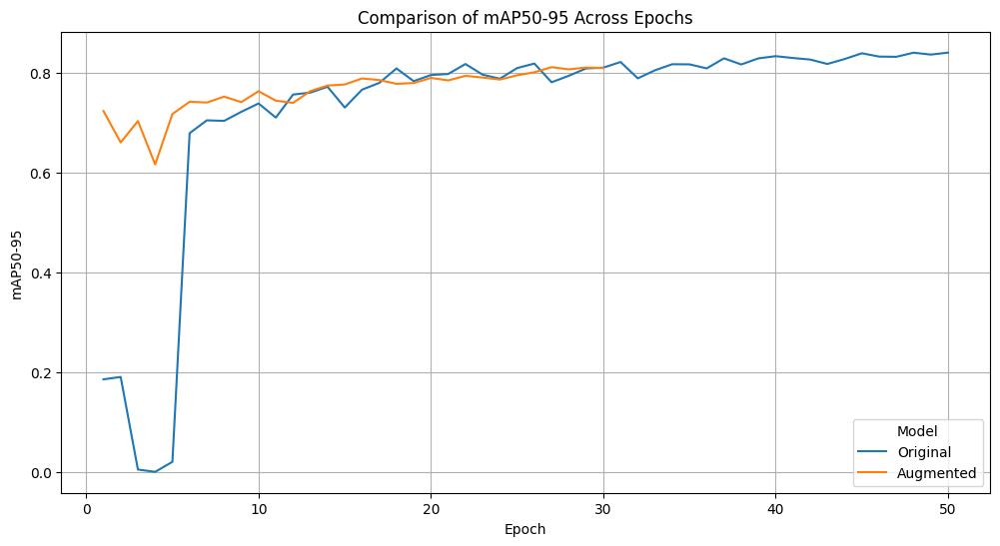

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load both result CSVs
original_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/results.csv'
augmented_path = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/results.csv'

# Read and clean column names
df_orig = pd.read_csv(original_path)
df_orig.columns = df_orig.columns.str.strip()  # Remove whitespace
df_orig['Model'] = 'Original'

df_aug = pd.read_csv(augmented_path)
df_aug.columns = df_aug.columns.str.strip()
df_aug['Model'] = 'Augmented'

# Print to verify correct column names
print("Original columns:", df_orig.columns.tolist())
print("Augmented columns:", df_aug.columns.tolist())

# Combine the two DataFrames
df_combined = pd.concat([df_orig, df_aug])

# Check actual column name for mAP50
map50_col = [col for col in df_combined.columns if 'mAP50' in col][0]
map5095_col = [col for col in df_combined.columns if 'mAP50-95' in col][0]

# Plot mAP50
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_combined, x='epoch', y=map50_col, hue='Model')
plt.title('Comparison of mAP50 Across Epochs')
plt.xlabel('Epoch')
plt.ylabel('mAP50')
plt.grid(True)
plt.show()

# Plot mAP50-95
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_combined, x='epoch', y=map5095_col, hue='Model')
plt.title('Comparison of mAP50-95 Across Epochs')
plt.xlabel('Epoch')
plt.ylabel('mAP50-95')
plt.grid(True)
plt.show()


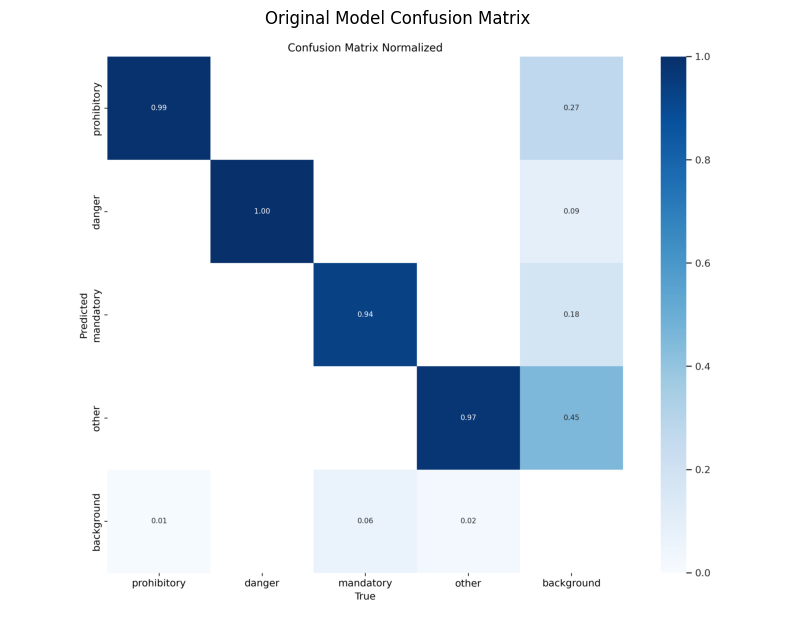

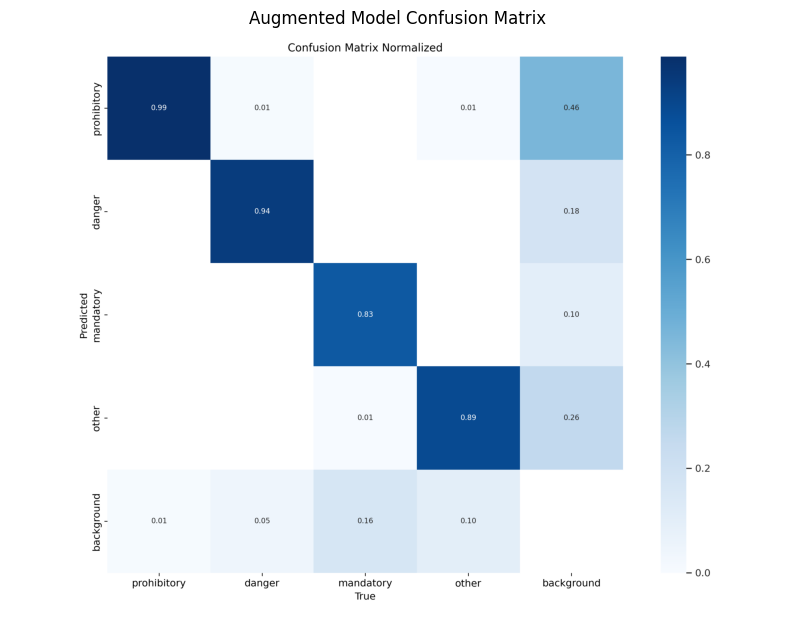

In [ ]:
from matplotlib import pyplot as plt
import matplotlib.image as mpimg

# Paths
orig_cm = '/content/drive/MyDrive/German/YoloOutputs/yolo-data/yolo-training-results/detect/train1/confusion_matrix_normalized.png'
aug_cm = '/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs/detect/train2/confusion_matrix_normalized.png'

# Show original
img1 = mpimg.imread(orig_cm)
plt.figure(figsize=(10, 8))
plt.title("Original Model Confusion Matrix")
plt.imshow(img1)
plt.axis('off')
plt.show()

# Show augmented
img2 = mpimg.imread(aug_cm)
plt.figure(figsize=(10, 8))
plt.title("Augmented Model Confusion Matrix")
plt.imshow(img2)
plt.axis('off')
plt.show()


In [ ]:
import cv2
import numpy as np
import albumentations as A
from tqdm import tqdm

# === Your augmentation functions ===
def add_snow(image, snow_density=0.1, blur_strength=3):
    snow_mask = np.random.random(image.shape[:2]) < snow_density
    snow_mask = np.float32(snow_mask)
    snow_mask = cv2.GaussianBlur(snow_mask, (blur_strength, blur_strength), 0)
    snow_mask_rgb = np.repeat(snow_mask[:, :, np.newaxis], 3, axis=2)
    snowflakes = np.ones_like(image) * 255
    snow_image = cv2.addWeighted(image, 1, snowflakes, 0.3, 0)
    snow_image = cv2.add(snow_image, np.uint8(snow_mask_rgb * 255))
    return snow_image

def add_rain(image, slant=-1, drop_length=15, drop_width=1, drop_color=(200, 200, 200), rain_drops=0.01):
    image_rain = cv2.addWeighted(image.copy(), 0.8, np.zeros_like(image), 0.2, 0)
    h, w = image.shape[:2]
    drop_count = int(rain_drops * w * h)
    for _ in range(drop_count):
        x = np.random.randint(0, w-1)
        y = np.random.randint(0, h-1)
        cv2.line(image_rain, (x, y), (x + slant, y + drop_length), drop_color, drop_width)
    return image_rain

def add_dim_light(image, brightness=0.4, contrast=1.2, tint=[80, 60, 40]):
    dim_image = cv2.convertScaleAbs(image, alpha=brightness, beta=0)
    tint_layer = np.ones_like(dim_image, dtype=np.uint8) * np.array(tint, dtype=np.uint8)
    return cv2.addWeighted(dim_image, 0.85, tint_layer, 0.15, 0)

fog_transform = A.Compose([
    A.RandomFog(fog_coef_lower=0.7, fog_coef_upper=0.8, alpha_coef=0.1, p=1)
])

import os

def augment_video(input_path, output_path, effect_fn, effect_name):
    cap = cv2.VideoCapture(input_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    # Ensure the directory exists
    os.makedirs(os.path.dirname(output_path), exist_ok=True)

    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    print(f"Applying {effect_name} effect to video...")

    for _ in tqdm(range(total_frames)):
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        augmented = effect_fn(frame)
        augmented = cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR)
        out.write(augmented)

    cap.release()
    out.release()

    # ✅ Check if the video was successfully saved
    if os.path.exists(output_path):
        print(f"✅ Video saved successfully: {output_path}")
    else:
        print(f"⚠️ Error: Video was not saved at {output_path}. Check permissions.")


# === Input video path ===
input_video = "/content/drive/MyDrive/German/traffic_signs_dataset/traffic-sign-to-test.mp4"

# === Output paths ===
augment_video(input_video,"/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_fog.mp4", lambda img: fog_transform(image=img)['image'], "Fog")
augment_video(input_video,"/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_snow.mp4", add_snow, "Snow")
augment_video(input_video,"/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_rain.mp4", add_rain, "Rain")
augment_video(input_video,"/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_dim.mp4", add_dim_light, "Dim Light")


<ipython-input-6-01e55c775e2a>:33: UserWarning: Argument(s) 'fog_coef_lower, fog_coef_upper' are not valid for transform RandomFog
  A.RandomFog(fog_coef_lower=0.7, fog_coef_upper=0.8, alpha_coef=0.1, p=1)


Applying Fog effect to video...


100%|██████████| 56/56 [00:27<00:00,  2.02it/s]


✅ Video saved successfully: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_fog.mp4
Applying Snow effect to video...


100%|██████████| 56/56 [00:02<00:00, 20.92it/s]


✅ Video saved successfully: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_snow.mp4
Applying Rain effect to video...


100%|██████████| 56/56 [00:06<00:00,  8.23it/s]


✅ Video saved successfully: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_rain.mp4
Applying Dim Light effect to video...


100%|██████████| 56/56 [00:01<00:00, 50.38it/s]

✅ Video saved successfully: /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test_video_dim.mp4


In [ ]:
import time
while True:
    print("Keeping session active...")
    time.sleep(600)  # Prevents timeout every 10 minutes


Keeping session active...
Keeping session active...
Keeping session active...


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-3-ecce93add20d>", line 4, in <cell line: 0>
    time.sleep(600)  # Prevents timeout every 10 minutes
    ^^^^^^^^^^^^^^^
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 2099, in showtraceback
    stb = value._render_traceback_()
          ^^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_

TypeError: object of type 'NoneType' has no len()

In [ ]:
# from ultralytics import YOLO
# import cv2


# model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
# model = YOLO(model_path)


# input_video = "/content/drive/MyDrive/Test/test_video.mp4"


# output_video = "/content/drive/MyDrive/Test/test_video_detected.mp4"


# model.predict(
#     source=input_video,
#     save=True,
#     save_txt=False,
#     save_conf=True,
#     # conf=0.25,
#     iou=0.5,
#     device='cpu',
#     project="/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/videos",
#     name="predictions",
#     show=False,
#     stream=True
# )


<generator object BasePredictor.stream_inference at 0x7fd53e797520>

In [ ]:
from ultralytics import YOLO
import cv2

# Load YOLO model
model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

# Input video path
input_video = "/content/drive/MyDrive/Test/test_videoo.mp4"

# Open the video
cap = cv2.VideoCapture(input_video)
frame_count = 0
frames_with_detections = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1
    results = model.predict(frame, conf=0.25, iou=0.5, device='cuda', verbose=False)

    # Check for detections in this frame
    detections = results[0].boxes
    if detections is not None and len(detections) > 0:
        frames_with_detections += 1
        print(f"\nFrame {frame_count}:")
        for box in detections:
            conf = float(box.conf[0])
            cls = int(box.cls[0])
            print(f" - Class: {cls}, Confidence: {conf:.2f}")

cap.release()
print(f"\nTotal frames processed: {frame_count}")
print(f"Frames with at least one detection: {frames_with_detections}")



Frame 36:
 - Class: 3, Confidence: 0.72

Frame 37:
 - Class: 3, Confidence: 0.83

Frame 38:
 - Class: 3, Confidence: 0.37

Frame 39:
 - Class: 3, Confidence: 0.78

Frame 40:
 - Class: 3, Confidence: 0.30

Frame 41:
 - Class: 3, Confidence: 0.90

Frame 42:
 - Class: 3, Confidence: 0.90

Frame 43:
 - Class: 3, Confidence: 0.90

Frame 44:
 - Class: 3, Confidence: 0.89

Frame 45:
 - Class: 3, Confidence: 0.90

Frame 46:
 - Class: 3, Confidence: 0.87

Frame 47:
 - Class: 3, Confidence: 0.85

Frame 48:
 - Class: 3, Confidence: 0.83

Frame 49:
 - Class: 3, Confidence: 0.88

Frame 50:
 - Class: 3, Confidence: 0.76

Total frames processed: 50
Frames with at least one detection: 15


In [ ]:
from ultralytics import YOLO

# Load YOLO model
model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

# Input video path
input_video = "/content/test_3.mp4"

# Run prediction (batch processing) and display results
model.predict(
    source=input_video,
    conf=0.25,
    iou=0.5,
    device='cuda',
    stream=False,  # Process whole video at once
    show=False   ,   # Show the video with detections
    project="/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/videos",
    name="predictions",
    save=True
)




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/395) /content/test_3.mp4: 288x640 (no detections), 52.2ms
video 1/1 (frame 2/395) /content/test_3.mp4: 288x640 (no detections), 36.6ms
video 1/1 (frame 3/395) /content/test_3.mp4: 288x640 (no detections), 36.6ms
video 1/1 (frame 4/395) /content/test_3.mp4: 288x640 (no detections), 36.6ms
video 1/1 (frame 5/395) /content/test_3.mp4: 288x640 (no detections), 30.8ms
video 1/1 (frame 6/395) /content/test_3.mp4: 288x640 (no detections), 2

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'prohibitory', 1: 'danger', 2: 'mandatory', 3: 'other'}
 obb: None
 orig_img: array([[[68, 48, 45],
         [66, 46, 43],
         [63, 43, 40],
         ...,
         [25, 15, 17],
         [24, 14, 16],
         [23, 13, 15]],
 
        [[68, 48, 45],
         [66, 46, 43],
         [63, 43, 40],
         ...,
         [23, 13, 15],
         [23, 13, 15],
         [21, 11, 13]],
 
        [[66, 46, 43],
         [65, 45, 42],
         [62, 42, 39],
         ...,
         [21, 11, 13],
         [21, 11, 13],
         [20, 10, 12]],
 
        ...,
 
        [[10, 12, 14],
         [10, 12, 14],
         [10, 12, 14],
         ...,
         [27, 34, 47],
         [28, 35, 48],
         [29, 36, 49]],
 
        [[10, 12, 14],
         [10, 12, 14],
         [10, 12, 14],
         ...,
         [32, 39, 52],
         [34, 41, 54],
       

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 /content/drive/MyDrive/Test/3.png: 384x640 1 danger, 68.7ms
Speed: 12.6ms preprocess, 68.7ms inference, 351.7ms postprocess per image at shape (1, 3, 384, 640)


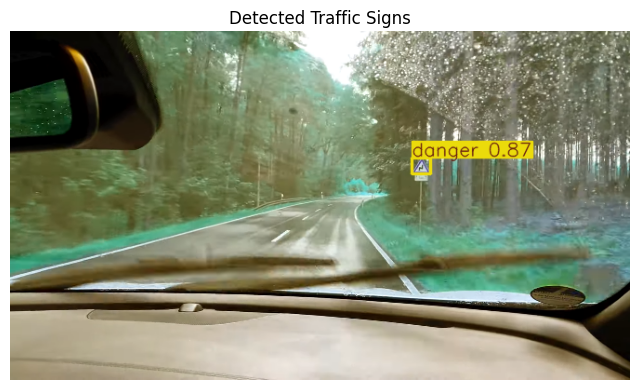

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt


model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00012_dim_light.jpg"  #dim_light prohibitory
#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00020_rain.jpg"  #rain danger
#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00040_fog.jpg"  #fog other mandatory
#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00098_snow.jpg"  #other
test_image_path = "/content/drive/MyDrive/Test/3.png" #danger rain

results = model.predict(test_image_path, conf=0.25)


result_image = results[0].plot()


plt.figure(figsize=(8, 8))
plt.imshow(result_image)
plt.axis("off")
plt.title("Detected Traffic Signs")
plt.show()


In [ ]:
# Run test evaluation
test_metrics = model.val(
    data="/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/data.yaml",
    split='test'
)

# Print results
test_results = test_metrics.results_dict
print("\n🧪 Test Set Performance:")
print(f"  - Precision:      {test_results['metrics/precision(B)']:.3f}")
print(f"  - Recall:         {test_results['metrics/recall(B)']:.3f}")
print(f"  - mAP@50:         {test_results['metrics/mAP50(B)']:.3f}")
print(f"  - mAP@50-95:      {test_results['metrics/mAP50-95(B)']:.3f}")


Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/test/labels... 375 images, 0 backgrounds, 0 corrupt: 100%|██████████| 375/375 [04:14<00:00,  1.47it/s]


val: New cache created: /content/drive/.shortcut-targets-by-id/1tuxj4FI3ZoLRfcI6xpLQgLockP2w5tPE/German/YoloOutputs/yolo-data-augmented/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:19<00:00,  1.25it/s]


                   all        375        625       0.96      0.935      0.967      0.829
           prohibitory        175        265      0.932      0.929      0.962        0.8
                danger         75         90      0.962          1      0.995      0.887
             mandatory         85        100      0.978      0.904      0.952      0.811
                 other        120        170      0.969      0.907      0.958      0.819
Speed: 0.8ms preprocess, 44.8ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/val

🧪 Test Set Performance:
  - Precision:      0.960
  - Recall:         0.935
  - mAP@50:         0.967
  - mAP@50-95:      0.829



📊 Class Distribution in TRAIN Set:
  - Class 0 (prohibitory): 400 samples
  - Class 1 (danger): 163 samples
  - Class 2 (mandatory): 104 samples
  - Class 3 (other): 179 samples

📊 Class Distribution in VAL Set:
  - Class 0 (prohibitory): 104 samples
  - Class 1 (danger): 38 samples
  - Class 2 (mandatory): 39 samples
  - Class 3 (other): 61 samples

📊 Class Distribution in TEST Set:
  - Class 0 (prohibitory): 53 samples
  - Class 1 (danger): 18 samples
  - Class 2 (mandatory): 20 samples
  - Class 3 (other): 34 samples


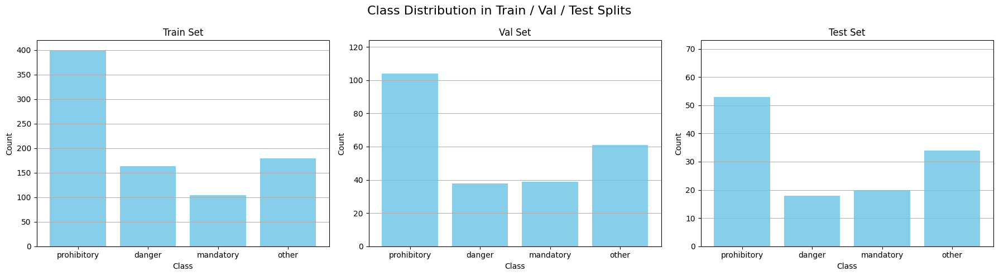

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt

# === Define paths ===
base_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data"
splits = ['train', 'val', 'test']
class_names = ["prohibitory", "danger", "mandatory", "other"]

def count_classes(label_dir):
    counts = Counter()
    for file in os.listdir(label_dir):
        if file.endswith('.txt'):
            with open(os.path.join(label_dir, file), 'r') as f:
                for line in f:
                    if line.strip():  # Skip empty lines
                        class_id = int(line.strip().split()[0])
                        counts[class_id] += 1
    return counts

# === Count and store distributions for all splits ===
all_counts = {}
for split in splits:
    label_dir = os.path.join(base_path, split, 'labels')
    counts = count_classes(label_dir)
    all_counts[split] = counts

# === Display Class Distribution ===
for split in splits:
    print(f"\n📊 Class Distribution in {split.upper()} Set:")
    counts = all_counts[split]
    for i in range(len(class_names)):
        print(f"  - Class {i} ({class_names[i]}): {counts.get(i, 0)} samples")

# === Plotting side-by-side bar charts ===
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for idx, split in enumerate(splits):
    counts = all_counts[split]
    labels = class_names
    values = [counts.get(i, 0) for i in range(len(class_names))]

    axes[idx].bar(labels, values, color='skyblue')
    axes[idx].set_title(f"{split.capitalize()} Set")
    axes[idx].set_ylabel("Count")
    axes[idx].set_xlabel("Class")
    axes[idx].set_ylim(0, max(values) + 20)
    axes[idx].grid(axis='y')

plt.suptitle("Class Distribution in Train / Val / Test Splits", fontsize=16)
plt.tight_layout()
plt.show()



📊 Class Distribution in TRAIN Set:
  - Class 0 (prohibitory): 2000 samples
  - Class 1 (danger): 815 samples
  - Class 2 (mandatory): 520 samples
  - Class 3 (other): 895 samples

📊 Class Distribution in VAL Set:
  - Class 0 (prohibitory): 520 samples
  - Class 1 (danger): 190 samples
  - Class 2 (mandatory): 195 samples
  - Class 3 (other): 305 samples

📊 Class Distribution in TEST Set:
  - Class 0 (prohibitory): 265 samples
  - Class 1 (danger): 90 samples
  - Class 2 (mandatory): 100 samples
  - Class 3 (other): 170 samples


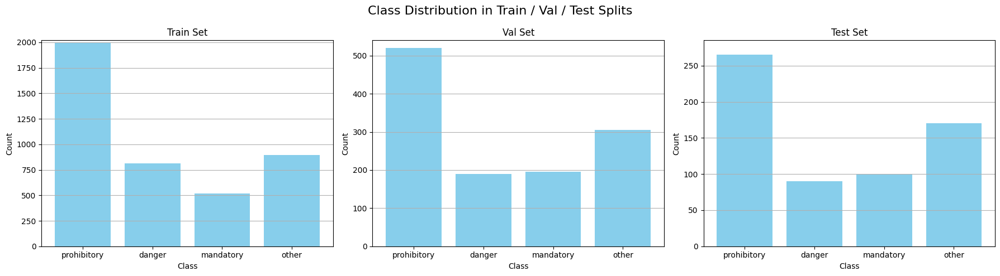

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt

# === Define paths ===
base_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented"
splits = ['train', 'val', 'test']
class_names = ["prohibitory", "danger", "mandatory", "other"]

def count_classes(label_dir):
    counts = Counter()
    for file in os.listdir(label_dir):
        if file.endswith('.txt'):
            with open(os.path.join(label_dir, file), 'r') as f:
                for line in f:
                    if line.strip():  # Skip empty lines
                        class_id = int(line.strip().split()[0])
                        counts[class_id] += 1
    return counts

# === Count and store distributions for all splits ===
all_counts = {}
for split in splits:
    label_dir = os.path.join(base_path, split, 'labels')
    counts = count_classes(label_dir)
    all_counts[split] = counts

# === Display Class Distribution ===
for split in splits:
    print(f"\n📊 Class Distribution in {split.upper()} Set:")
    counts = all_counts[split]
    for i in range(len(class_names)):
        print(f"  - Class {i} ({class_names[i]}): {counts.get(i, 0)} samples")

# === Plotting side-by-side bar charts ===
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for idx, split in enumerate(splits):
    counts = all_counts[split]
    labels = class_names
    values = [counts.get(i, 0) for i in range(len(class_names))]

    axes[idx].bar(labels, values, color='skyblue')
    axes[idx].set_title(f"{split.capitalize()} Set")
    axes[idx].set_ylabel("Count")
    axes[idx].set_xlabel("Class")
    axes[idx].set_ylim(0, max(values) + 20)
    axes[idx].grid(axis='y')

plt.suptitle("Class Distribution in Train / Val / Test Splits", fontsize=16)
plt.tight_layout()
plt.show()


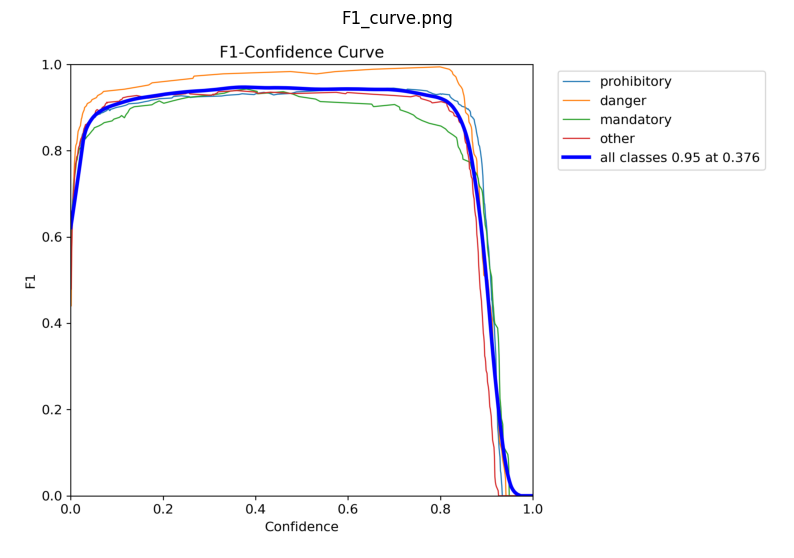

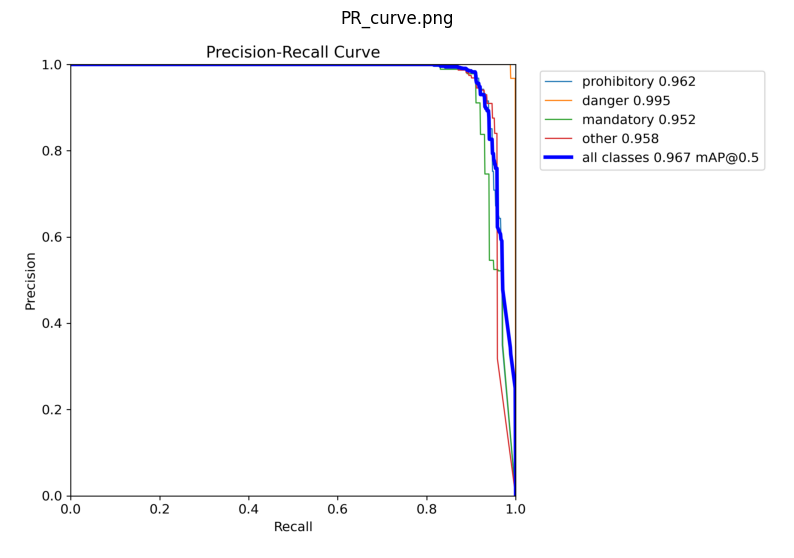

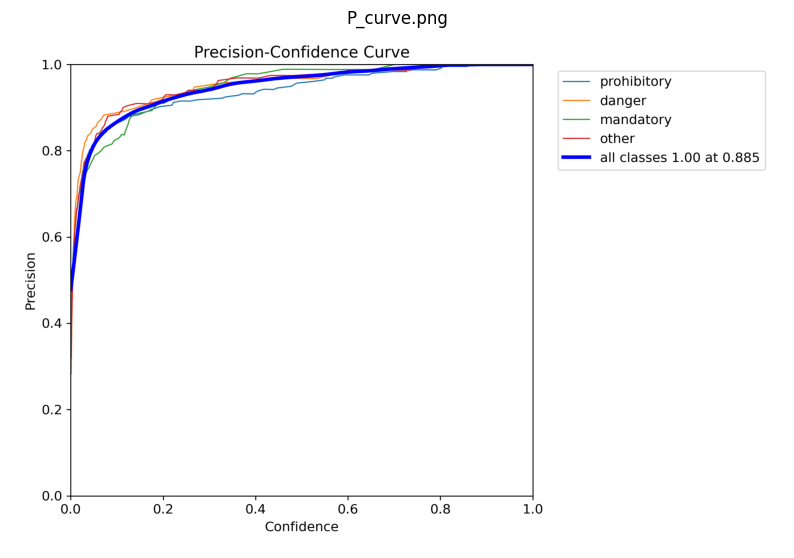

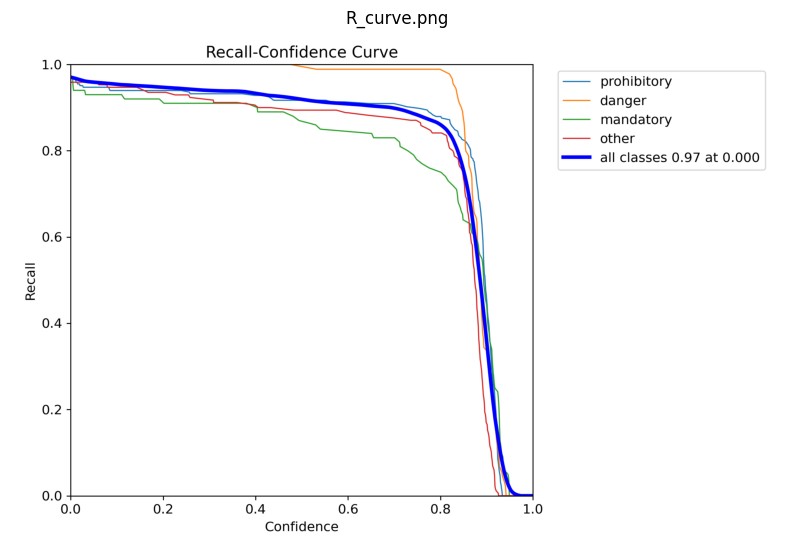

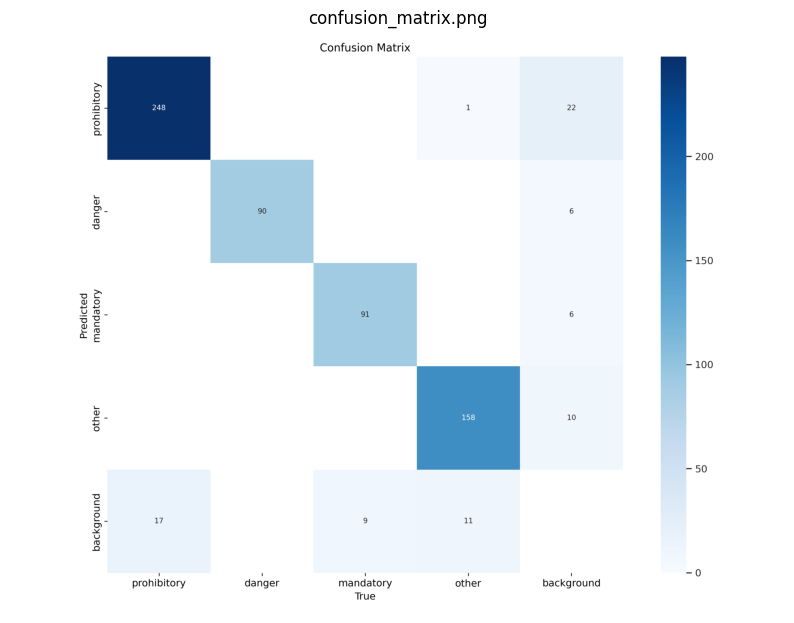

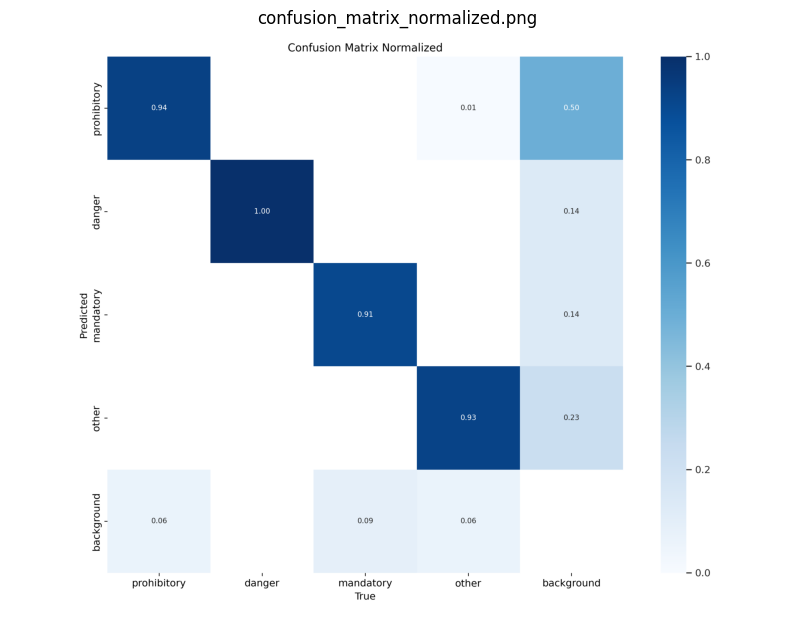

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

results_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/runs1/detect/test"

png_files = sorted([f for f in os.listdir(results_dir) if f.lower().endswith('.png')])

for png_file in png_files:
    img_path = os.path.join(results_dir, png_file)
    img = mpimg.imread(img_path)

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title(png_file)
    plt.axis('off')
    plt.show()


test performance ->No transfer learning->directly trained yolov8 with orginal+augmented datset




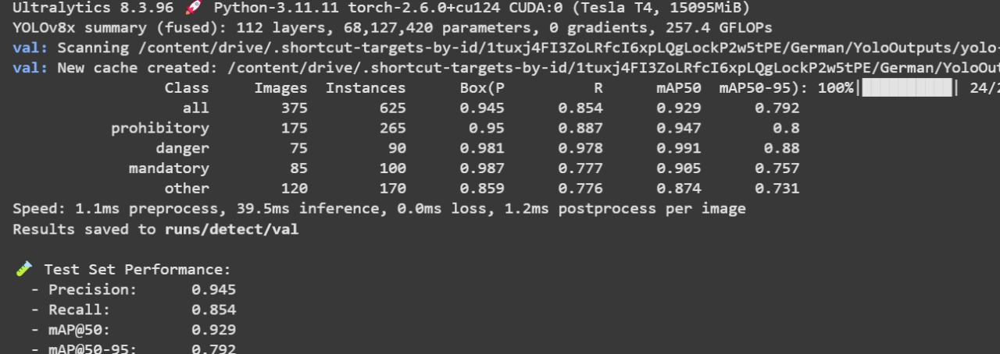

In [ ]:
from ultralytics import YOLO
import os
import shutil

# === Load your final trained model ===
model = YOLO("/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt")

# === Paths to test images/labels ===
test_img_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images"
test_lbl_dir = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/labels"

# === Get list of 75 images for each condition ===
conditions = {
    "fog": sorted([f for f in os.listdir(test_img_dir) if "_fog" in f])[:75],
    "rain": sorted([f for f in os.listdir(test_img_dir) if "_rain" in f])[:75],
    "snow": sorted([f for f in os.listdir(test_img_dir) if "_snow" in f])[:75],
    "dim_light": sorted([f for f in os.listdir(test_img_dir) if "_dim_light" in f])[:75]
}

results_per_condition = []

# === Evaluation loop (one condition at a time) ===
for condition, image_list in conditions.items():
    print(f"\n🔍 Evaluating on {condition.upper()} images...")

    # Temporary folder for evaluation
    subset_dir = f"/content/{condition}_eval"
    img_dir = os.path.join(subset_dir, "images")
    lbl_dir = os.path.join(subset_dir, "labels")
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(lbl_dir, exist_ok=True)

    # Copy images and labels
    for img_name in image_list:
        shutil.copy(os.path.join(test_img_dir, img_name), os.path.join(img_dir, img_name))
        label_name = img_name.replace(".jpg", ".txt")
        shutil.copy(os.path.join(test_lbl_dir, label_name), os.path.join(lbl_dir, label_name))

    # Create YAML
    yaml_path = os.path.join(subset_dir, "data.yaml")
    with open(yaml_path, "w") as f:
        f.write(f"""names:
  0: prohibitory
  1: danger
  2: mandatory
  3: other
nc: 4
train: {img_dir}  # dummy, required
val: {img_dir}    # dummy, required
test: {img_dir}
""")

    # Evaluate
    metrics = model.val(data=yaml_path, split='test')
    r = metrics.results_dict

    print(f"📊 {condition.title()} Results:")
    print(f"  - Precision:      {r['metrics/precision(B)']:.3f}")
    print(f"  - Recall:         {r['metrics/recall(B)']:.3f}")
    print(f"  - mAP@50:         {r['metrics/mAP50(B)']:.3f}")
    print(f"  - mAP@50-95:      {r['metrics/mAP50-95(B)']:.3f}")

    results_per_condition.append({
        "Condition": condition,
        "Precision": r['metrics/precision(B)'],
        "Recall": r['metrics/recall(B)'],
        "mAP@50": r['metrics/mAP50(B)'],
        "mAP@50-95": r['metrics/mAP50-95(B)']
    })



🔍 Evaluating on FOG images...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 112 layers, 68,127,420 parameters, 0 gradients, 257.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 19.8MB/s]
val: Scanning /content/fog_eval/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 1188.27it/s]

val: New cache created: /content/fog_eval/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.02it/s]


                   all         75        125      0.937      0.864       0.92      0.768
           prohibitory         35         53      0.952       0.83      0.902      0.737
                danger         15         18      0.946      0.972      0.992      0.846
             mandatory         17         20      0.922        0.8      0.852      0.703
                 other         24         34      0.927      0.853      0.934      0.787
Speed: 4.1ms preprocess, 37.7ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/val2
📊 Fog Results:
  - Precision:      0.937
  - Recall:         0.864
  - mAP@50:         0.920
  - mAP@50-95:      0.768

🔍 Evaluating on RAIN images...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/rain_eval/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 2612.28it/s]

val: New cache created: /content/rain_eval/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.07it/s]


                   all         75        125      0.964      0.936      0.967       0.82
           prohibitory         35         53      0.936      0.943      0.973       0.78
                danger         15         18      0.939          1      0.995      0.895
             mandatory         17         20          1      0.919      0.954        0.8
                 other         24         34      0.982      0.882      0.946      0.804
Speed: 5.8ms preprocess, 38.4ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val3
📊 Rain Results:
  - Precision:      0.964
  - Recall:         0.936
  - mAP@50:         0.967
  - mAP@50-95:      0.820

🔍 Evaluating on SNOW images...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/snow_eval/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 2555.67it/s]

val: New cache created: /content/snow_eval/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.10it/s]


                   all         75        125      0.957      0.935      0.975      0.842
           prohibitory         35         53      0.932      0.925      0.972      0.819
                danger         15         18      0.932          1      0.995      0.894
             mandatory         17         20          1      0.934      0.967      0.839
                 other         24         34      0.964      0.882      0.965      0.817
Speed: 4.2ms preprocess, 38.6ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val4
📊 Snow Results:
  - Precision:      0.957
  - Recall:         0.935
  - mAP@50:         0.975
  - mAP@50-95:      0.842

🔍 Evaluating on DIM_LIGHT images...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/dim_light_eval/labels... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 2467.35it/s]

val: New cache created: /content/dim_light_eval/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]


                   all         75        125      0.979      0.952      0.983      0.861
           prohibitory         35         53      0.962      0.943      0.986      0.848
                danger         15         18       0.97          1      0.995      0.897
             mandatory         17         20      0.984        0.9      0.973       0.85
                 other         24         34          1      0.965       0.98      0.847
Speed: 3.4ms preprocess, 39.2ms inference, 0.1ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val5
📊 Dim_Light Results:
  - Precision:      0.979
  - Recall:         0.952
  - mAP@50:         0.983
  - mAP@50-95:      0.861


In [ ]:
import pandas as pd

# Create a DataFrame with your results
results_df = pd.DataFrame({
    "Condition": ["Fog", "Rain", "Snow", "Dim Light"],
    "Precision": [0.937, 0.964, 0.957, 0.979],
    "Recall": [0.864, 0.936, 0.935, 0.952],
    "mAP@50": [0.920, 0.967, 0.975, 0.983],
    "mAP@50-95": [0.768, 0.820, 0.842, 0.861]
})

# Display it nicely
from IPython.display import display
display(results_df)


,Condition,Precision,Recall,mAP@50,mAP@50-95
0,Fog,0.937,0.864,0.920,0.768
1,Rain,0.964,0.936,0.967,0.820
2,Snow,0.957,0.935,0.975,0.842
3,Dim Light,0.979,0.952,0.983,0.861


In [ ]:
# Save as CSV
results_df.to_csv("/content/drive/MyDrive/German/visibility_test_results.csv", index=False)


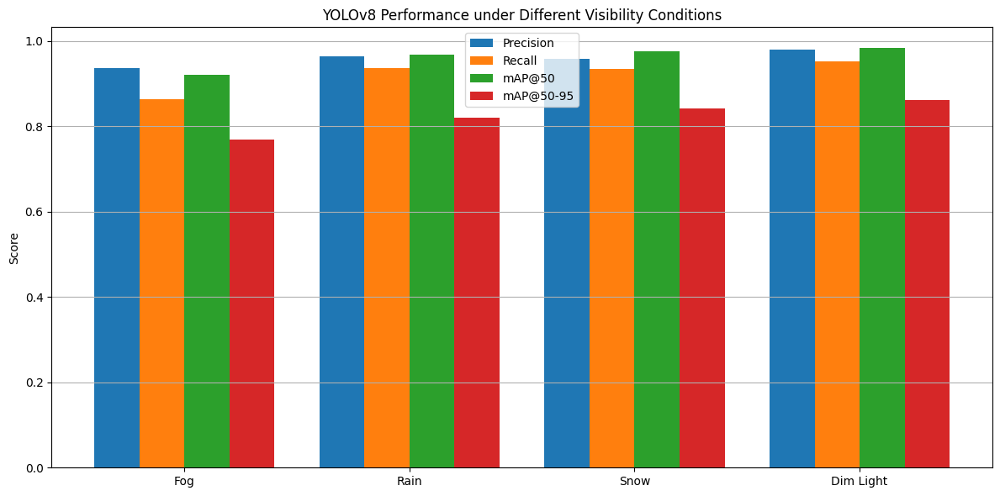

In [ ]:
import matplotlib.pyplot as plt

conditions = ["Fog", "Rain", "Snow", "Dim Light"]
precision = [0.937, 0.964, 0.957, 0.979]
recall = [0.864, 0.936, 0.935, 0.952]
map50 = [0.920, 0.967, 0.975, 0.983]
map5095 = [0.768, 0.820, 0.842, 0.861]

x = range(len(conditions))
bar_width = 0.2

plt.figure(figsize=(12, 6))
plt.bar([p - 1.5*bar_width for p in x], precision, width=bar_width, label='Precision')
plt.bar([p - 0.5*bar_width for p in x], recall, width=bar_width, label='Recall')
plt.bar([p + 0.5*bar_width for p in x], map50, width=bar_width, label='mAP@50')
plt.bar([p + 1.5*bar_width for p in x], map5095, width=bar_width, label='mAP@50-95')

plt.xticks(x, conditions)
plt.ylabel("Score")
plt.title("YOLOv8 Performance under Different Visibility Conditions")
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()


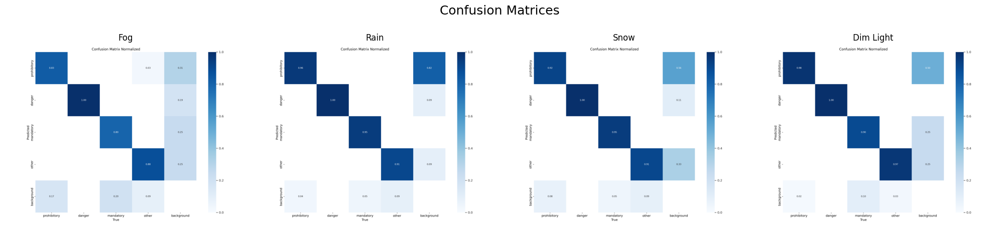

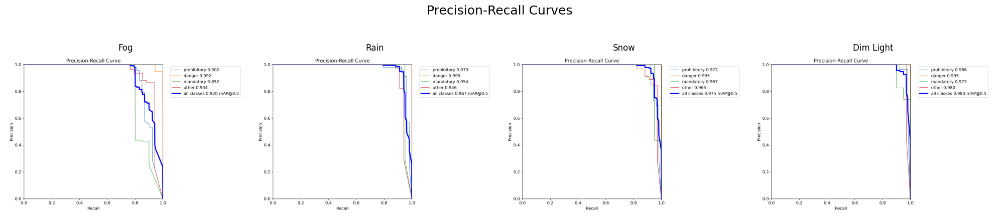

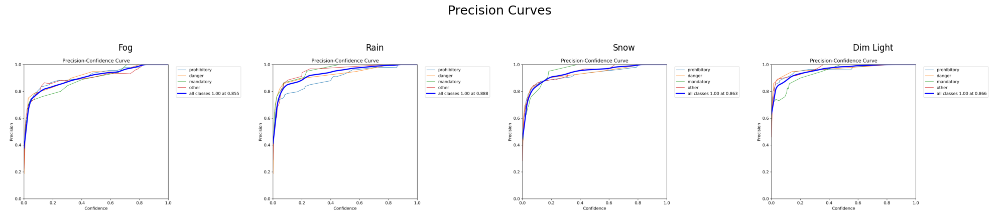

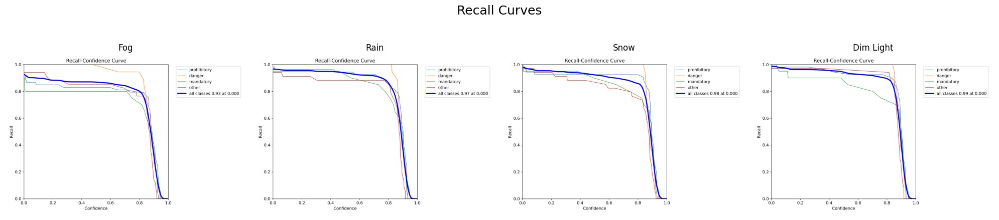

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define paths to each run folder (change if needed)
eval_dirs = {
    "Fog": "/content/drive/MyDrive/sep_val/runs/detect/val2",
    "Rain": "/content/drive/MyDrive/sep_val/runs/detect/val3",
    "Snow": "/content/drive/MyDrive/sep_val/runs/detect/val4",
    "Dim Light": "/content/drive/MyDrive/sep_val/runs/detect/val5"
}

# File names to load from each folder
conf_matrix_file = "confusion_matrix_normalized.png"
pr_curve_file = "PR_curve.png"
p_curve_file = "P_curve.png"
r_curve_file = "R_curve.png"

# Plot side-by-side for each graph type
def plot_comparative_images(title, filename, ncols=4):
    fig, axes = plt.subplots(1, ncols, figsize=(5 * ncols, 5))
    fig.suptitle(title, fontsize=18)

    for ax, (label, path) in zip(axes, eval_dirs.items()):
        img_path = os.path.join(path, filename)
        if os.path.exists(img_path):
            img = mpimg.imread(img_path)
            ax.imshow(img)
            ax.set_title(label)
            ax.axis("off")
        else:
            ax.set_title(f"{label} (Not Found)")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

# Plot all
plot_comparative_images("Confusion Matrices", conf_matrix_file)
plot_comparative_images("Precision-Recall Curves", pr_curve_file)
plot_comparative_images("Precision Curves", p_curve_file)
plot_comparative_images("Recall Curves", r_curve_file)


In [ ]:
import cv2
import time
import os
from ultralytics import YOLO

# Load trained model
model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

# Video source (you can use webcam as well with 0)
video_path = "/content/drive/MyDrive/Test/test_video5.mp4"  # or 0 for webcam
cap = cv2.VideoCapture(video_path)

# Frame and FPS counters
frame_count = 0
total_inference_time = 0

# Loop through video frames
while True:
    ret, frame = cap.read()
    if not ret:
        break

    start_time = time.time()
    _ = model.predict(frame, conf=0.25, iou=0.5, device='cuda', verbose=False)
    end_time = time.time()

    # Track inference time
    inference_time = end_time - start_time
    total_inference_time += inference_time
    frame_count += 1

# Calculate average inference time and FPS
avg_time = total_inference_time / frame_count
fps = 1 / avg_time if avg_time > 0 else 0

print(f"\nProcessed {frame_count} frames")
print(f"Average Inference Time per Frame: {avg_time:.4f} seconds")
print(f"Real-Time FPS: {fps:.2f}")

cap.release()



Processed 205 frames
Average Inference Time per Frame: 0.0500 seconds
Real-Time FPS: 19.99


In [ ]:
import cv2
import time
import os
from ultralytics import YOLO

# Load model
model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

# Video source
video_path = "/content/drive/MyDrive/Test/test_video.mp4"
cap = cv2.VideoCapture(video_path)

# Video properties
fps_input = int(cap.get(cv2.CAP_PROP_FPS))
width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Output path
output_path = "/content/drive/MyDrive/Test/test_video_detected.mp4"
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_path, fourcc, fps_input, (width, height))

# Frame and timing
frame_count = 0
total_inference_time = 0

# Process video
while True:
    ret, frame = cap.read()
    if not ret:
        break

    start_time = time.time()
    results = model.predict(frame, conf=0.25, iou=0.5, device='cuda', verbose=False)
    end_time = time.time()

    # Get the annotated frame
    annotated_frame = results[0].plot()

    # Save the frame to output video
    out.write(annotated_frame)

    # Track time
    total_inference_time += (end_time - start_time)
    frame_count += 1

# Release resources
cap.release()
out.release()

# Compute and print FPS
avg_time = total_inference_time / frame_count
fps = 1 / avg_time if avg_time > 0 else 0

print(f"\nProcessed {frame_count} frames")
print(f" Avg Inference Time/Frame: {avg_time:.4f} sec")
print(f"Real-Time FPS: {fps:.2f}")
print(f"Output saved to: {output_path}")



📹 Processed 93 frames
🕒 Avg Inference Time/Frame: 0.0531 sec
⚡ Real-Time FPS: 18.85
✅ Output saved to: /content/drive/MyDrive/Test/test_video_detected.mp4



image 1/1 /content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00020_rain.jpg: 384x640 1 danger, 58.6ms
Speed: 2.4ms preprocess, 58.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


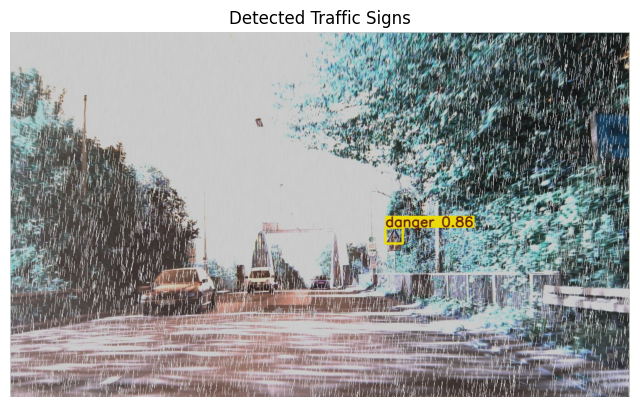

In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt


model_path = "/content/drive/MyDrive/German/yolov8_low_visibility_trained.pt"
model = YOLO(model_path)

#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00012_dim_light.jpg"  #dim_light prohibitory
#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00020_rain.jpg"  #rain danger
test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00020_rain.jpg"  #fog other mandatory
#test_image_path = "/content/drive/MyDrive/German/YoloOutputs/yolo-data-augmented/test/images/00098_snow.jpg"  #other
#test_image_path = "/content/drive/MyDrive/Test/3.png" #danger rain

results = model.predict(test_image_path, conf=0.25)


result_image = results[0].plot()


plt.figure(figsize=(8, 8))
plt.imshow(result_image)
plt.axis("off")
plt.title("Detected Traffic Signs")
plt.show()